Recordatorio

* C] Probablemente se hubieran mejorado los resultados si se hubieran utilizado varios modelos a modo de ensemble, por ejemplo separando por ciudad.
* D] Se echan en falta mucho mejores interpretaciones, discusiones y comparativas de los resultados de las predicciones."

In [1]:
# Conectamos con nuestro Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Descargo el dataset almacenado en csv, obtenido de las descargas de Aemet

In [2]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
from sklearn.impute import KNNImputer
import numpy as np
import seaborn as sns
seed = 42

In [3]:
datacsv = "./drive/MyDrive/MASTER_BIG_DATA/14_TFM/scripts/csv/dataset_asturias.csv"
dataset= pd.read_csv(datacsv, delimiter=",", encoding="utf-8")
display(dataset.head(5))

<ipython-input-3-97ef538cb522>:2: DtypeWarning: Columns (21,24) have mixed types. Specify dtype option on import or set low_memory=False.
  dataset= pd.read_csv(datacsv, delimiter=",", encoding="utf-8")


,indicativo,provincia,tmax,horaracha,presMin,horaPresMin,hrMedia,altitud,prec,horatmin,...,horaPresMax,fecha,sol,tmin,velmedia,dir,horaHrMin,hrMax,hrMin,horaHrMax
0,1208A,ASTURIAS,"11,2",NaN,NaN,NaN,87.0,22,"0,0",09:00,...,NaN,1950-01-02,"5,0","3,4",NaN,NaN,NaN,NaN,NaN,NaN
1,1208A,ASTURIAS,"12,8",NaN,NaN,NaN,80.0,22,"0,0",07:00,...,NaN,1950-01-03,"5,4","2,8",NaN,NaN,NaN,NaN,NaN,NaN
2,1208A,ASTURIAS,"13,2",NaN,NaN,NaN,93.0,22,"0,0",07:00,...,NaN,1950-01-04,"7,2","3,2",NaN,NaN,NaN,NaN,NaN,NaN
3,1208A,ASTURIAS,"13,1",NaN,NaN,NaN,86.0,22,"0,0",07:00,...,NaN,1950-01-05,"5,5","4,9",NaN,NaN,NaN,NaN,NaN,NaN
4,1208A,ASTURIAS,"13,9",NaN,NaN,NaN,83.0,22,"0,0",09:00,...,NaN,1950-01-06,"5,3","7,1",NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
hidro_csv = "./drive/MyDrive/MASTER_BIG_DATA/14_TFM/scripts/datos_cofederacion_hidrográfica/sella.csv"
dataset_hidro= pd.read_csv(hidro_csv, delimiter=",", encoding="utf-8")
display(dataset_hidro.sample(5))

,estacion,fecha,altura_m,caudal_m3s
3138,1295,2009-05-05,1.16,24.983
478,1295,2002-01-22,0.70,11.032
4024,1295,2011-10-08,1.28,2.472
3478,1295,2010-04-10,0.90,12.351
1240,1295,2004-02-23,0.57,7.399


In [5]:
print(dataset.describe())

             hrMedia        altitud            dir          hrMax  \
count  211174.000000  244036.000000  206086.000000  149193.000000   
mean       78.061598     366.505331      23.659002      94.343575   
std        11.967130     444.489213      20.959919       7.627100   
min         9.000000       3.000000       0.000000      22.000000   
25%        71.000000      40.000000       9.000000      92.000000   
50%        79.000000     240.000000      22.000000      97.000000   
75%        87.000000     370.000000      30.000000     100.000000   
max       100.000000    1530.000000      99.000000     100.000000   

               hrMin  
count  149192.000000  
mean       61.140282  
std        16.148768  
min         1.000000  
25%        51.000000  
50%        61.000000  
75%        72.000000  
max       100.000000  


In [6]:
# Convertir la columna 'Fecha' a formato datetime
dataset['fecha'] = pd.to_datetime(dataset['fecha'])
# Definir la fecha mínima permitida
fecha_minima = pd.Timestamp("1970-01-01")

# Filtrar el DataFrame
dataset = dataset[dataset['fecha'] >= fecha_minima]

## Transformaciones

In [7]:
dataset['prec'] = (dataset['prec'].replace('Ip', 0.1))
dataset['prec'] = (dataset['prec'].replace('Acum', 100.0))
dataset['prec'] = (dataset['prec']).str.replace(',', '.', regex=False)
dataset.info()

<class 'pandas.core.frame.DataFrame'>
Index: 236214 entries, 7822 to 244035
Data columns (total 25 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   indicativo   236214 non-null  object        
 1   provincia    236214 non-null  object        
 2   tmax         223660 non-null  object        
 3   horaracha    202283 non-null  object        
 4   presMin      93266 non-null   object        
 5   horaPresMin  93253 non-null   object        
 6   hrMedia      203352 non-null  float64       
 7   altitud      236214 non-null  int64         
 8   prec         222828 non-null  object        
 9   horatmin     219841 non-null  object        
 10  racha        202316 non-null  object        
 11  tmed         223649 non-null  object        
 12  presMax      93576 non-null   object        
 13  horatmax     219978 non-null  object        
 14  nombre       236214 non-null  object        
 15  horaPresMax  93574 non-null   object

In [8]:
def convertir_coma_float(valor):
    try:
        # Reemplazar la coma por punto y convertir a float
        return float(valor.replace(',', '.'))
    except (ValueError, AttributeError):
        # Si no se puede convertir (por ejemplo, si es texto no numérico), devolver el valor original
        return valor

columnas_a_convertir = ['tmax', 'presMin', 'hrMedia', 'altitud', 'prec', 'racha', 'tmed', 'presMax', 'sol', 'tmin', 'velmedia', 'dir', 'hrMax', 'hrMin']
for col in columnas_a_convertir:
    dataset[col] = dataset[col].apply(convertir_coma_float)

In [ ]:
#dataset = dataset.drop(columns=['level_0'])
#dataset = dataset.drop(columns=['index'])
dataset = dataset.reset_index()

In [9]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
Index: 236214 entries, 7822 to 244035
Data columns (total 25 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   indicativo   236214 non-null  object        
 1   provincia    236214 non-null  object        
 2   tmax         223660 non-null  float64       
 3   horaracha    202283 non-null  object        
 4   presMin      93266 non-null   float64       
 5   horaPresMin  93253 non-null   object        
 6   hrMedia      203352 non-null  float64       
 7   altitud      236214 non-null  int64         
 8   prec         222828 non-null  float64       
 9   horatmin     219841 non-null  object        
 10  racha        202316 non-null  float64       
 11  tmed         223649 non-null  float64       
 12  presMax      93576 non-null   float64       
 13  horatmax     219978 non-null  object        
 14  nombre       236214 non-null  object        
 15  horaPresMax  93574 non-null   object

## Trabajo con la provincia de Asturias

In [10]:
# provincias_filtradas = ["ALICANTE"]
# dataset_alicante = dataset[dataset["provincia"].isin(provincias_filtradas)]
dataset_asturias = dataset.copy()

In [11]:
def hora_a_decimal(hora_str):
    if hora_str:
        if hora_str != 'Varias':
            if type(hora_str) is not float:
                try:
                    if ':' in hora_str:
                        horas, minutos = map(int, hora_str.split(':'))
                    else:
                        horas = int(hora_str)
                        minutos = 0  # Si no hay minutos, se asume 0
                    # Convertir a decimal
                    decimal = horas + minutos / 60
                    return decimal
                except Exception as err:
                    print(err)
                    return None
        else:
            return None

columnas_a_convertir = ['horaPresMin', 'horaracha', 'horatmin', 'horatmax', 'horaPresMax', 'horaHrMin', 'hrMax', 'hrMin', 'horaHrMax']  # Reemplaza con tus columnas de hora

# Aplicar la función a las columnas seleccionadas
for col in columnas_a_convertir:
    dataset_asturias[col] = dataset_asturias[col].apply(hora_a_decimal)
#print(f"{hora} en formato decimal es: {resultado}")

In [ ]:
#dataset_alicante = dataset_alicante[['index','nombre','fecha','indicativo','provincia','tmax', 'presMin', 'hrMedia', 'altitud', 'prec', 'racha', 'tmed', 'presMax', 'sol', 'tmin', 'velmedia', 'dir']]

In [12]:
dataset_asturias.info()

<class 'pandas.core.frame.DataFrame'>
Index: 236214 entries, 7822 to 244035
Data columns (total 25 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   indicativo   236214 non-null  object        
 1   provincia    236214 non-null  object        
 2   tmax         223660 non-null  float64       
 3   horaracha    191624 non-null  float64       
 4   presMin      93266 non-null   float64       
 5   horaPresMin  84364 non-null   float64       
 6   hrMedia      203352 non-null  float64       
 7   altitud      236214 non-null  int64         
 8   prec         222828 non-null  float64       
 9   horatmin     197765 non-null  float64       
 10  racha        202316 non-null  float64       
 11  tmed         223649 non-null  float64       
 12  presMax      93576 non-null   float64       
 13  horatmax     211728 non-null  float64       
 14  nombre       236214 non-null  object        
 15  horaPresMax  80808 non-null   float6

In [14]:
display(dataset_asturias.sample(5))

,indicativo,provincia,tmax,horaracha,presMin,horaPresMin,hrMedia,altitud,prec,horatmin,...,horaPresMax,fecha,sol,tmin,velmedia,dir,horaHrMin,hrMax,hrMin,horaHrMax
90030,1183X,ASTURIAS,18.9,17.000000,1022.2,24.0,76.0,10,0.0,5.000000,...,11.0,2007-06-02,NaN,12.4,3.1,10.0,7.333333,None,None,NaN
52402,1542,ASTURIAS,6.9,NaN,NaN,NaN,82.0,1530,0.1,17.750000,...,NaN,1999-12-04,NaN,1.5,1.1,32.0,13.000000,None,None,NaN
202864,1208H,ASTURIAS,15.6,NaN,1013.8,16.0,96.0,5,3.9,NaN,...,0.0,2020-04-09,NaN,11.8,NaN,NaN,20.833333,None,None,7.0
233429,1272B,ASTURIAS,20.5,14.000000,NaN,NaN,84.0,280,7.8,NaN,...,NaN,2023-08-26,NaN,12.6,1.1,29.0,12.333333,None,None,NaN
148437,1309C,ASTURIAS,13.8,16.166667,NaN,NaN,56.0,780,0.0,5.933333,...,NaN,2015-03-18,NaN,4.8,3.6,12.0,13.000000,None,None,NaN


In [15]:
# codifico las variables de texto con labelEncoder.
#***
dfcopy = dataset_asturias
dataset_asturias = dfcopy.copy()
#***
# Inicializar el codificador
le = LabelEncoder()
# Convertir la columna 'Ciudad' en números
dataset_asturias['numero_ciudad'] = le.fit_transform(dataset_asturias['nombre'])
dataset_asturias['numero_provincia'] = le.fit_transform(dataset_asturias['provincia'])
dataset_asturias['numero_indicativo'] = le.fit_transform(dataset_asturias['indicativo'])
# Ver resultados
print(dataset_asturias[['numero_ciudad', 'nombre']].sample(5))

        numero_ciudad         nombre
120153             16  MIERES, BAIÑA
98306              14   LENA, RONZÓN
117979              4     CABO PEÑAS
221459             14   LENA, RONZÓN
203102              7        COLUNGA


In [16]:
display(dataset_asturias.describe())

,tmax,horaracha,presMin,horaPresMin,hrMedia,altitud,prec,horatmin,racha,tmed,...,fecha,sol,tmin,velmedia,dir,horaHrMin,horaHrMax,numero_ciudad,numero_provincia,numero_indicativo
count,223660.000000,191624.000000,93266.000000,84364.000000,203352.000000,236214.000000,222828.000000,197765.000000,202316.000000,223649.000000,...,236214,89170.000000,223653.000000,205743.000000,202316.000000,131947.000000,67657.000000,236214.000000,236214.0,236214.000000
mean,16.995410,12.927985,989.439046,11.860000,78.079955,377.683037,3.082694,9.939792,9.584858,12.974800,...,2009-02-16 06:35:31.890574080,4.879818,8.953985,2.561616,23.730338,12.596001,10.698831,12.238064,0.0,13.375744
min,-7.500000,0.000000,810.500000,0.000000,9.000000,3.000000,0.000000,0.000000,0.000000,-9.200000,...,1970-01-01 00:00:00,0.000000,-18.400000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
25%,13.100000,10.166667,979.200000,3.000000,71.000000,60.000000,0.000000,4.366667,6.100000,9.400000,...,2002-08-03 00:00:00,1.200000,5.300000,1.400000,9.000000,11.166667,3.500000,5.000000,0.0,7.000000
50%,17.200000,13.666667,1001.100000,13.000000,79.000000,280.000000,0.000000,6.083333,8.300000,13.200000,...,2013-03-25 00:00:00,4.500000,9.200000,1.900000,22.000000,13.000000,7.166667,13.000000,0.0,13.000000
75%,21.200000,16.000000,1012.800000,21.000000,87.000000,410.000000,2.700000,21.000000,11.700000,17.000000,...,2018-03-28 00:00:00,8.000000,13.000000,3.300000,30.000000,14.666667,20.666667,18.000000,0.0,19.000000
max,41.400000,83.983333,1040.100000,24.000000,100.000000,1530.000000,189.800000,24.000000,55.000000,31.700000,...,2024-11-17 00:00:00,14.900000,24.100000,22.200000,99.000000,23.983333,23.983333,26.000000,0.0,27.000000
std,5.968478,6.083390,39.911662,9.118663,12.069444,447.428723,7.110118,8.416459,4.950177,5.302174,...,NaN,3.901520,5.219179,1.866774,21.084981,4.394000,8.693661,7.497684,0.0,7.281751


In [17]:
dataset_asturias.info()

<class 'pandas.core.frame.DataFrame'>
Index: 236214 entries, 7822 to 244035
Data columns (total 28 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   indicativo         236214 non-null  object        
 1   provincia          236214 non-null  object        
 2   tmax               223660 non-null  float64       
 3   horaracha          191624 non-null  float64       
 4   presMin            93266 non-null   float64       
 5   horaPresMin        84364 non-null   float64       
 6   hrMedia            203352 non-null  float64       
 7   altitud            236214 non-null  int64         
 8   prec               222828 non-null  float64       
 9   horatmin           197765 non-null  float64       
 10  racha              202316 non-null  float64       
 11  tmed               223649 non-null  float64       
 12  presMax            93576 non-null   float64       
 13  horatmax           211728 non-null  float64   

## Estudio de nan toda provincia

In [18]:
# EJEMPLO: Contar valores perdidos
def imprimir_nan(dataset):
    valores_nan = dataset.isnull().sum()
    print(type(valores_nan))

    # Creo la gráfica para visibilizar mejor
    plt.figure(figsize=(15, 6))
    plt.bar(valores_nan.index, valores_nan.values, color='b')

    # Añado títulos y etiquetas
    plt.title('Número de valores NaN por variable')
    plt.xlabel('Nombre de variable')
    plt.ylabel('Número de filas con NaN por variable')
    plt.xticks(rotation=45)

    plt.grid(True)
    plt.show()

Tengo que eliminar presMin, horaPresMin, presMax, horaPresMax

In [19]:
# Elimino variables nulas
dataset_asturias = dataset_asturias.drop(columns=['horaHrMin', 'hrMax', 'hrMin', 'horaHrMax', 'sol'])

In [20]:

dataset_asturias = dataset_asturias.drop(columns=['presMin', 'horaPresMin', 'presMax', 'horaPresMax'])

In [21]:
lista_columnas=dataset_asturias.columns.to_list()
print(lista_columnas)

['indicativo', 'provincia', 'tmax', 'horaracha', 'hrMedia', 'altitud', 'prec', 'horatmin', 'racha', 'tmed', 'horatmax', 'nombre', 'fecha', 'tmin', 'velmedia', 'dir', 'numero_ciudad', 'numero_provincia', 'numero_indicativo']


## Outliers

In [22]:
#Determino si hay valores fuera de rango en variables numéricas
# Función para identificar valores fuera de rango usando RI(rango intercuartílico)
def detectar_outliers_RI(df):
    for columna in df.select_dtypes(include=[np.number]).columns:
        outliers = {}
        Q1 = df[columna].quantile(0.25)
        Q3 = df[columna].quantile(0.75)
        RI = Q3 - Q1
        limite_inferior = Q1 - 1.5 * RI
        limite_superior = Q3 + 1.5 * RI
        if limite_inferior !=0 and limite_superior != 0:
            outliers[columna] = df[(df[columna] < limite_inferior) | (df[columna] > limite_superior)][columna]
            print(f'{columna}')
            print(f'limite inferior: {limite_inferior}')
            print(f'limite superior: {limite_superior}')
            print(f'número de outliers: {outliers[columna].count()} \n')
        else:
            outliers[columna] = df[(df[columna] < 0)][columna]
            print(f'{columna}')
            print(f'limite inferior: {limite_inferior}')
            print(f'limite superior: {limite_superior}')
            print(f'número de outliers: {outliers[columna].count()} \n')
    return outliers

# Muestra graficamente los outliers
def calculolimites(columna, df):
    Q1 = df[columna].quantile(0.25)
    Q3 = df[columna].quantile(0.75)
    RI = Q3 - Q1
    mediana = df[columna].median()
    limite_inferior = Q1 - 1.5 * RI
    limite_superior = Q3 + 1.5 * RI

    # genero diagrama de cajas para las variables que tienen valores fuera de rango.
    plt.figure(figsize=(8, 4))
    sns.boxplot(x=df[columna], color='yellow', showmeans=True, meanline=True)
    # añado todos los datos con stripplot para visualizarlos sobre el boxplot
    sns.stripplot(x=df[columna], color='red', size=1, jitter=True, edgecolor='black')
    # añado etiquetas para las líneas del boxplot
    plt.text(mediana, 0.25, f'Mediana\n({mediana:.2f})', horizontalalignment='center', color='green', fontsize=10)
    plt.text(Q1, -0.2, f'Q1\n({Q1:.2f})', horizontalalignment='center', color='darkblue', fontsize=10)
    plt.text(Q3, -0.3, f'Q3\n({Q3:.2f})', horizontalalignment='center', color='darkblue', fontsize=10)
    plt.text(limite_inferior, 0.2, f'Límite Inferior\n({limite_inferior:.2f})', horizontalalignment='center', color='red', fontsize=10)
    plt.text(limite_superior, 0.2, f'Límite Superior\n({limite_superior:.2f})', horizontalalignment='center', color='blue', fontsize=10)
    plt.title(f'Diagrama de cajas de: {columna}')
    plt.show()

## Graficas comparación variables

In [23]:
def trans_fecha(dataset):
    # Asegurar que la columna es de tipo datetime
    dataset['fecha'] = pd.to_datetime(dataset['fecha'])

    # Crear las nuevas columnas
    dataset['año'] = dataset['fecha'].dt.year
    dataset['mes'] = dataset['fecha'].dt.month
    dataset['día'] = dataset['fecha'].dt.day

In [24]:
def grafico_prec(dataset):
    plt.figure(figsize=(12, 6))
    plt.fill_between(dataset['fecha'], dataset['prec'], color="skyblue", alpha=0.4)
    sns.lineplot(data=dataset, x='fecha', y='prec', color='Slateblue', linewidth=2)
    plt.title('Gráfico de Área de total_cases respecto a temp')
    plt.xlabel('Tiempo (temp)')
    plt.ylabel('Total de Casos')
    plt.grid(True)
    plt.show()

In [25]:
def grafico_individual_ggplot(dataset, variable1, limite_inferior=100):
    # Configurar el estilo de los gráficos
    plt.style.use('ggplot')

    # Crear la figura para graficar la evolución temporal
    plt.figure(figsize=(12, 6))

    # Graficar la evolución temporal de las tres variables
    plt.plot(dataset['fecha'], dataset[variable1], color='blue', label=variable1)
    #plt.plot(dataset['fecha'], dataset[variable2], color='green', label=variable2)
    # Agregar una línea horizontal en el valor 90
    plt.axhline(y=limite_inferior, color='red', linestyle='--', linewidth=1.5, label=f'Límite {limite_inferior}')

    # Título y etiquetas de los ejes
    plt.title('Evolución temporal de la variable precipitaciones')
    plt.xlabel('Fecha')
    plt.ylabel('Valores')
    plt.legend()

    # Rotar las etiquetas del eje x
    plt.xticks(rotation=45)

    # Ajustar el diseño para evitar que se corten las etiquetas
    plt.tight_layout()

    # Mostrar el gráfico
    plt.show()

In [26]:
import matplotlib.pyplot as plt

def grafico_comparacion_ggplot(dataset, variable1, variable2, limite_inferior=2):
    # Configurar el estilo de los gráficos
    plt.style.use('ggplot')

    # Crear la figura y los ejes
    fig, ax1 = plt.subplots(figsize=(12, 6))

    # Crear un segundo eje y
    ax2 = ax1.twinx()

    # Graficar la primera variable en el eje primario
    line1, =ax1.plot(dataset['fecha'], dataset[variable1], color='blue', label=variable1)
    ax1.set_ylabel(variable1, color='blue')

    # Graficar la segunda variable en el eje secundario
    line2, =ax2.plot(dataset['fecha'], dataset[variable2], color='green', label=variable2)
    ax2.set_ylabel(variable2, color='green')

    # Agregar una línea horizontal en el valor límite en el primer eje
    ax1.axhline(y=limite_inferior, color='red', linestyle='--', linewidth=1.5, label=f'Límite {limite_inferior}')

    # Título y etiquetas del eje x
    plt.title('Evolución temporal de las variables')

    ax1.set_xlabel('Fecha')

    # Rotar las etiquetas del eje x
    plt.xticks(rotation=45)

     # Agregar leyenda con ambas variables
    ax1.legend([line1, line2], [variable1, variable2], loc='upper left')

    # Ajustar el diseño para evitar que se corten las etiquetas
    fig.tight_layout()

    # Mostrar el gráfico
    plt.show()


## Histogramas

In [27]:
def histogramas(dataset):
    # Crear un histograma utilizando seaborn
    fig, axes = plt.subplots(4, 4, figsize=(15, 10))
    colores = sns.color_palette('Set2', len(dataset.columns))
    # Generar un histograma para cada variable
    for i, (column, ax) in enumerate(zip(dataset.columns, axes.flatten())):
        sns.histplot(dataset[column],
                    bins=30,
                    kde=True,
                    ax=ax,
                    color=colores[i])
        ax.set_title(f'Histograma de {column}')
        ax.set_xlabel('Valores de variable')
        ax.set_ylabel('Frecuencia')

    # Ajustar el layout
    plt.tight_layout(pad=2)
    plt.show()

## Correlaciones

In [28]:
def correlacion(dataset):
    # heatmap del dataframe normal
    num_columnas=dataset.columns.to_list()

    plt.figure(figsize=(20,10))
    sns.heatmap(data=dataset[num_columnas].corr(),annot=True)
    plt.show()

## Separación por ciudades

In [67]:
lista_nombres = dataset_asturias['nombre'].drop_duplicates().to_list()
print(lista_nombres)

['ASTURIAS AEROPUERTO', 'GIJÓN. LA MERCED', 'OVIEDO', 'GIJÓN', 'MIERES, BAIÑA', 'GIJÓN, CAMPUS', 'PAJARES-VALGRANDE', 'PUERTO DE LEITARIEGOS', 'CABO BUSTO', 'LLANES', 'CABO PEÑAS', 'GIJÓN, PUERTO', 'COLUNGA', 'VILLAYÓN, ONETA', 'SALAS, CAMUÑO', 'IBIAS, SAN ANTOLIN', 'TINEO, SOUTU', 'DEGAÑA', 'AMIEVA, PANIZALES', 'PILOÑA, BARGAÉU', 'ALLER, FELECHOSA', 'TARAMUNDI, OURIA', 'POLA DE SOMIEDO', 'LENA, RONZÓN', 'CABRALES', 'CASTROPOL', 'SOTRES, PARQUE NACIONAL PICOS DE EUROPA']


### CABRALES

#### Genero dataframe

In [114]:
ciudades_filtradas = ['CABRALES']
dataset_asturias_cabrales = dataset_asturias[dataset_asturias['nombre'].isin(ciudades_filtradas)]
dataset_asturias_cabrales.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5912 entries, 98526 to 244021
Data columns (total 19 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   indicativo         5912 non-null   object        
 1   provincia          5912 non-null   object        
 2   tmax               5854 non-null   float64       
 3   horaracha          5507 non-null   float64       
 4   hrMedia            5881 non-null   float64       
 5   altitud            5912 non-null   int64         
 6   prec               5546 non-null   float64       
 7   horatmin           5083 non-null   float64       
 8   racha              5700 non-null   float64       
 9   tmed               5854 non-null   float64       
 10  horatmax           5753 non-null   float64       
 11  nombre             5912 non-null   object        
 12  fecha              5912 non-null   datetime64[ns]
 13  tmin               5854 non-null   float64       
 14  velmedi

In [115]:
# Asegurar que la columna 'fecha' de ambos DataFrames esté en formato datetime
dataset_asturias_cabrales["fecha"] = pd.to_datetime(dataset_asturias_cabrales["fecha"], format="%Y-%m-%d", errors="coerce")
dataset_hidro["fecha"] = pd.to_datetime(dataset_hidro["fecha"], format="%Y-%m-%d", errors="coerce")

<ipython-input-115-94d6c37f01b6>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset_asturias_cabrales["fecha"] = pd.to_datetime(dataset_asturias_cabrales["fecha"], format="%Y-%m-%d", errors="coerce")


In [116]:
# como se procederá a convertir los valores nan, antes se pasan los valores negativos a nan.
# Convertir valores negativos en NaN
dataset_hidro["altura_m"] = dataset_hidro["altura_m"].apply(lambda x: np.nan if x < 0 else x)
dataset_hidro["caudal_m3s"] = dataset_hidro["caudal_m3s"].apply(lambda x: np.nan if x < 0 else x)

In [117]:
# Unir los DataFrames por la columna "ID"
df_merged = pd.merge(dataset_asturias_cabrales, dataset_hidro, on="fecha", how="inner")
display(df_merged.head(10))

,indicativo,provincia,tmax,horaracha,hrMedia,altitud,prec,horatmin,racha,tmed,...,fecha,tmin,velmedia,dir,numero_ciudad,numero_provincia,numero_indicativo,estacion,altura_m,caudal_m3s
0,1179B,ASTURIAS,21.3,NaN,86.0,458,NaN,2.750000,NaN,17.2,...,2009-07-23,13.0,NaN,NaN,5,0,1,1295,1.04,18.710
1,1179B,ASTURIAS,24.4,NaN,77.0,458,NaN,4.166667,NaN,18.6,...,2009-07-24,12.9,NaN,NaN,5,0,1,1295,0.79,8.701
2,1179B,ASTURIAS,23.2,NaN,75.0,458,NaN,NaN,NaN,18.4,...,2009-07-25,13.6,NaN,NaN,5,0,1,1295,0.70,6.167
3,1179B,ASTURIAS,24.9,NaN,78.0,458,NaN,2.516667,NaN,19.2,...,2009-07-26,13.5,NaN,NaN,5,0,1,1295,0.59,3.788
4,1179B,ASTURIAS,19.9,NaN,90.0,458,NaN,23.650000,NaN,16.4,...,2009-07-27,12.8,NaN,NaN,5,0,1,1295,0.62,4.393
5,1179B,ASTURIAS,25.2,NaN,74.0,458,NaN,2.066667,NaN,18.6,...,2009-07-28,12.1,NaN,NaN,5,0,1,1295,0.60,3.845
6,1179B,ASTURIAS,24.6,NaN,80.0,458,NaN,NaN,NaN,19.0,...,2009-07-29,13.5,NaN,NaN,5,0,1,1295,0.61,4.073
7,1179B,ASTURIAS,18.4,NaN,91.0,458,NaN,23.800000,NaN,15.9,...,2009-07-30,13.4,NaN,NaN,5,0,1,1295,0.61,4.031
8,1179B,ASTURIAS,23.9,NaN,74.0,458,NaN,3.950000,NaN,17.9,...,2009-07-31,11.9,NaN,NaN,5,0,1,1295,0.63,4.412
9,1179B,ASTURIAS,NaN,NaN,89.0,458,NaN,NaN,NaN,NaN,...,2009-08-01,NaN,NaN,NaN,5,0,1,1295,0.70,6.083


In [118]:
dataset_asturias_cabrales = df_merged
display(dataset_asturias_cabrales.describe())

,tmax,horaracha,hrMedia,altitud,prec,horatmin,racha,tmed,horatmax,fecha,tmin,velmedia,dir,numero_ciudad,numero_provincia,numero_indicativo,estacion,altura_m,caudal_m3s
count,4805.000000,4495.000000,4816.000000,4844.0,4514.000000,4133.000000,4653.000000,4805.000000,4717.000000,4844,4805.000000,4656.000000,4653.000000,4844.0,4844.0,4844.0,4844.0,4726.000000,4334.000000
mean,18.083351,13.183578,79.981105,458.0,3.344860,9.863340,10.843585,13.570198,12.846294,2015-10-08 18:22:17.737406976,9.055921,2.921907,25.102300,5.0,0.0,1.0,1295.0,1.760178,19.446653
min,1.100000,0.166667,22.000000,458.0,0.000000,0.016667,2.500000,-0.500000,0.016667,2009-07-23 00:00:00,-4.200000,0.000000,1.000000,5.0,0.0,1.0,1295.0,0.260000,1.045000
25%,13.800000,10.500000,72.000000,458.0,0.000000,4.366667,6.900000,9.800000,12.100000,2013-04-02 18:00:00,5.600000,1.700000,12.000000,5.0,0.0,1.0,1295.0,1.540000,5.701000
50%,18.100000,14.000000,82.000000,458.0,0.200000,5.900000,8.900000,13.800000,13.316667,2015-12-12 12:00:00,9.100000,2.500000,25.000000,5.0,0.0,1.0,1295.0,1.730000,11.251500
75%,22.500000,16.500000,91.000000,458.0,2.800000,21.250000,12.800000,17.400000,14.316667,2018-05-02 06:00:00,12.700000,3.600000,31.000000,5.0,0.0,1.0,1295.0,2.050000,23.147000
max,38.100000,62.666667,100.000000,458.0,89.400000,24.000000,49.700000,28.100000,23.983333,2021-09-30 00:00:00,19.800000,15.600000,99.000000,5.0,0.0,1.0,1295.0,6.080000,495.001000
std,6.122368,5.901031,14.150073,0.0,7.657994,8.455452,6.076742,5.071670,3.246420,NaN,4.477638,1.747133,19.088614,0.0,0.0,0.0,0.0,0.564052,26.278400


In [119]:
# Se borran variables innecesarias
dataset_asturias_cabrales = dataset_asturias_cabrales.drop(columns=['numero_ciudad', 'numero_provincia', 'numero_indicativo', 'estacion'])

#### Estudio nan

<class 'pandas.core.series.Series'>


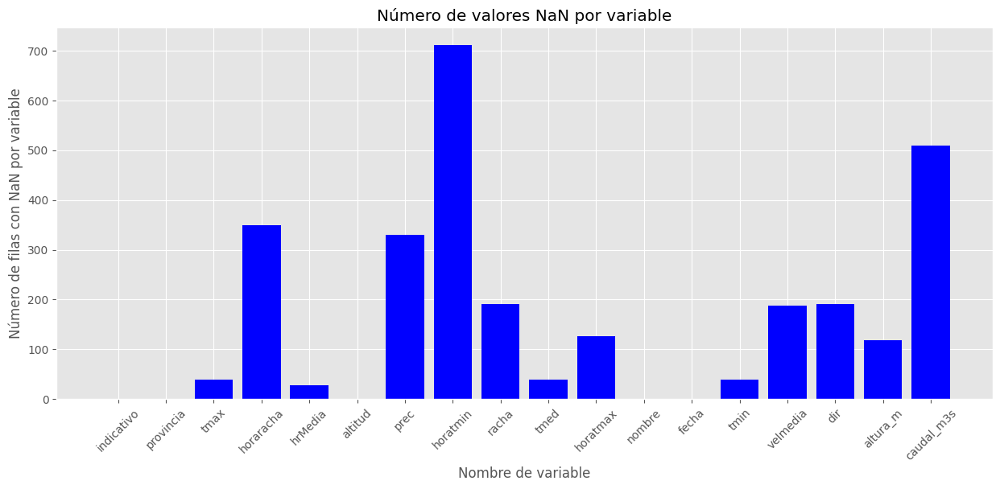

In [120]:
imprimir_nan(dataset_asturias_cabrales)

In [121]:
# Imputación usando KNN
imputer = KNNImputer(n_neighbors=3)
dataset_asturias_cabrales[[
    'tmax', 'horaracha', 'hrMedia', 'altitud', 'racha',
    'tmed', 'horatmax', 'tmin', 'velmedia', 'dir', 'altura_m']] = imputer.fit_transform(dataset_asturias_cabrales[[
    'tmax', 'horaracha', 'hrMedia', 'altitud', 'racha',
    'tmed', 'horatmax', 'tmin', 'velmedia', 'dir', 'altura_m']])

In [122]:
dataset_asturias_cabrales[['caudal_m3s', 'horatmin', 'prec']] = dataset_asturias_cabrales[['caudal_m3s', 'horatmin', 'prec']].interpolate(method='linear')

In [123]:
#dataset_asturias_cabrales['prec'] = dataset_asturias_cabrales['prec'].interpolate(method='polynomial', order=2)

In [124]:
# Suponiendo que tu DataFrame se llama 'df'
filas_con_nan_en_prec = dataset_asturias_cabrales[dataset_asturias_cabrales['prec'].isna()]

# Mostrar las filas
display(filas_con_nan_en_prec)

,indicativo,provincia,tmax,horaracha,hrMedia,altitud,prec,horatmin,racha,tmed,horatmax,nombre,fecha,tmin,velmedia,dir,altura_m,caudal_m3s
0,1179B,ASTURIAS,21.300000,6.277778,86.0,458.0,NaN,2.750000,5.466667,17.200000,11.800000,CABRALES,2009-07-23,13.000000,1.466667,15.000000,1.04,18.710
1,1179B,ASTURIAS,24.400000,5.388889,77.0,458.0,NaN,4.166667,6.300000,18.600000,12.466667,CABRALES,2009-07-24,12.900000,1.933333,16.333333,0.79,8.701
2,1179B,ASTURIAS,23.200000,6.277778,75.0,458.0,NaN,3.341667,5.566667,18.400000,12.616667,CABRALES,2009-07-25,13.600000,1.566667,12.000000,0.70,6.167
3,1179B,ASTURIAS,24.900000,4.944444,78.0,458.0,NaN,2.516667,6.933333,19.200000,11.800000,CABRALES,2009-07-26,13.500000,1.566667,22.333333,0.59,3.788
4,1179B,ASTURIAS,19.900000,8.666667,90.0,458.0,NaN,23.650000,8.533333,16.400000,10.050000,CABRALES,2009-07-27,12.800000,2.600000,21.000000,0.62,4.393
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
161,1179B,ASTURIAS,18.200000,5.555556,77.0,458.0,NaN,23.800000,5.466667,12.500000,12.033333,CABRALES,2010-04-11,6.800000,1.466667,19.333333,0.91,12.989
162,1179B,ASTURIAS,10.900000,6.277778,75.0,458.0,NaN,21.150000,5.466667,8.200000,15.050000,CABRALES,2010-04-12,5.400000,1.466667,15.000000,0.91,12.817
163,1179B,ASTURIAS,11.500000,6.277778,71.0,458.0,NaN,1.466667,5.466667,8.300000,14.400000,CABRALES,2010-04-13,5.100000,1.466667,15.000000,0.86,11.172
164,1179B,ASTURIAS,13.100000,6.277778,72.0,458.0,NaN,6.066667,5.466667,8.100000,11.016667,CABRALES,2010-04-14,3.100000,1.466667,15.000000,0.80,9.072


In [125]:
# como hay valores de prec que no puedo interpolar ni cambiar con knn los convierto a cero.
dataset_asturias_cabrales['prec'] = dataset_asturias_cabrales['prec'].fillna(0)

In [126]:
dataset_asturias_cabrales['prec'] = dataset_asturias_cabrales['prec'].apply(lambda x: 0 if x < 0 else x)

In [127]:
display(dataset_asturias_cabrales.describe())

,tmax,horaracha,hrMedia,altitud,prec,horatmin,racha,tmed,horatmax,fecha,tmin,velmedia,dir,altura_m,caudal_m3s
count,4844.000000,4844.000000,4844.000000,4844.0,4844.000000,4844.000000,4844.000000,4844.000000,4844.000000,4844,4844.000000,4844.000000,4844.000000,4844.000000,4844.000000
mean,18.071614,12.952878,79.947495,458.0,3.330161,9.902071,10.696029,13.561203,12.842768,2015-10-08 18:22:17.737406976,9.049560,2.883382,24.827140,1.747163,17.963797
min,1.100000,0.166667,22.000000,458.0,0.000000,0.016667,2.500000,-0.500000,0.016667,2009-07-23 00:00:00,-4.200000,0.000000,1.000000,0.260000,1.045000
25%,13.700000,10.166667,72.000000,458.0,0.000000,4.472917,6.900000,9.800000,12.100000,2013-04-02 18:00:00,5.600000,1.700000,12.000000,1.520000,5.219500
50%,18.100000,13.833333,82.000000,458.0,0.200000,6.000000,8.600000,13.800000,13.316667,2015-12-12 12:00:00,9.100000,2.500000,25.000000,1.720000,9.698500
75%,22.500000,16.333333,91.000000,458.0,2.800000,18.052778,12.500000,17.400000,14.300000,2018-05-02 06:00:00,12.700000,3.600000,31.000000,2.040000,21.038750
max,38.100000,62.666667,100.000000,458.0,89.400000,24.000000,49.700000,28.100000,23.983333,2021-09-30 00:00:00,19.800000,15.600000,99.000000,6.080000,495.001000
std,6.119068,5.848416,14.159739,0.0,7.743694,8.167719,6.026849,5.066981,3.223946,NaN,4.470078,1.731845,18.810768,0.563646,25.243832


In [128]:
dataset_asturias_cabrales.iloc[1011]

,1011
indicativo,1179B
provincia,ASTURIAS
tmax,25.4
horaracha,13.666667
hrMedia,72.0
altitud,458.0
prec,0.0
horatmin,5.133333
racha,6.9
tmed,18.6


#### Outliers

In [129]:
#muestro columnas con datos numericos
lista_variables = dataset_asturias_cabrales.select_dtypes(include=np.number).columns
lista_variables.tolist()

['tmax',
 'horaracha',
 'hrMedia',
 'altitud',
 'prec',
 'horatmin',
 'racha',
 'tmed',
 'horatmax',
 'tmin',
 'velmedia',
 'dir',
 'altura_m',
 'caudal_m3s']

In [130]:
outliers = detectar_outliers_RI(dataset_asturias_cabrales)
#display(outliers)

tmax
limite inferior: 0.4999999999999982
limite superior: 35.7
número de outliers: 6 

horaracha
limite inferior: 0.9166666666666661
limite superior: 25.583333333333332
número de outliers: 169 

hrMedia
limite inferior: 43.5
limite superior: 119.5
número de outliers: 86 

altitud
limite inferior: 458.0
limite superior: 458.0
número de outliers: 0 

prec
limite inferior: -4.199999999999999
limite superior: 6.999999999999999
número de outliers: 720 

horatmin
limite inferior: -15.896874999999998
limite superior: 38.42256944444444
número de outliers: 0 

racha
limite inferior: -1.4999999999999982
limite superior: 20.9
número de outliers: 371 

tmed
limite inferior: -1.599999999999996
limite superior: 28.799999999999997
número de outliers: 0 

horatmax
limite inferior: 8.799999999999997
limite superior: 17.6
número de outliers: 383 

tmin
limite inferior: -5.049999999999999
limite superior: 23.349999999999998
número de outliers: 0 

velmedia
limite inferior: -1.1500000000000001
limite supe

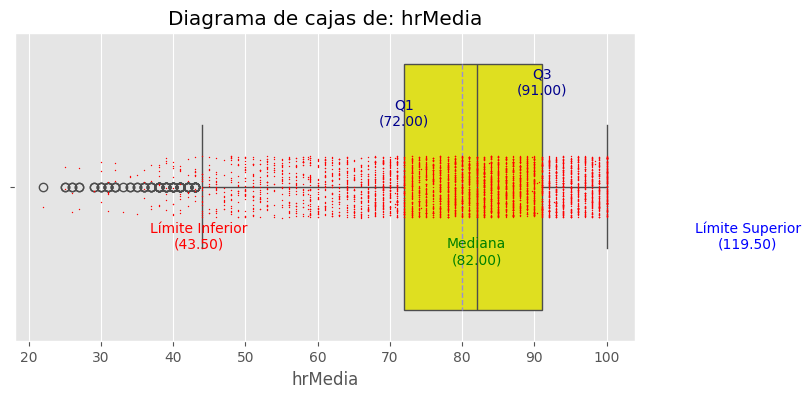

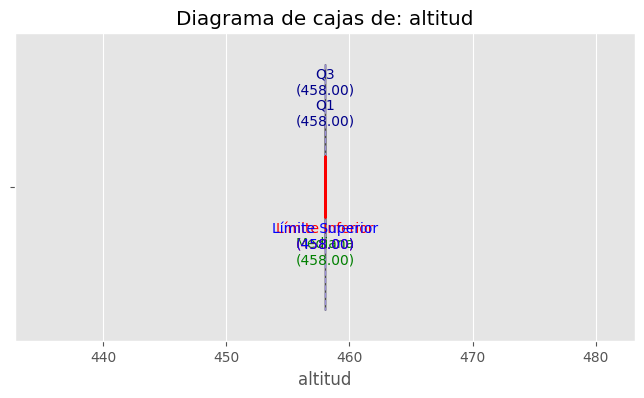

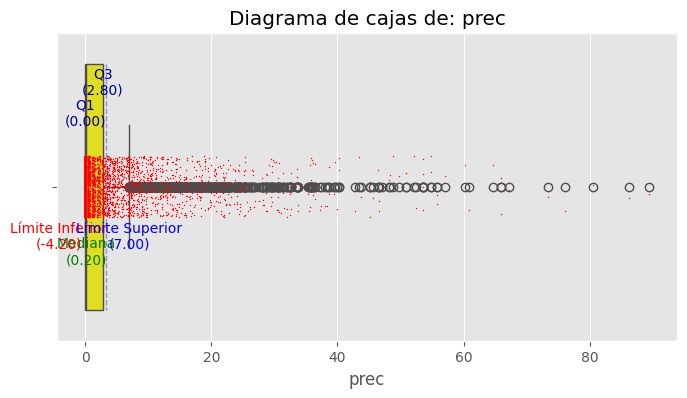

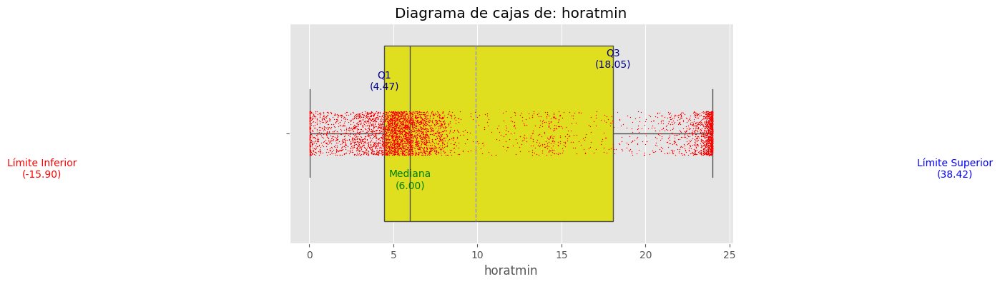

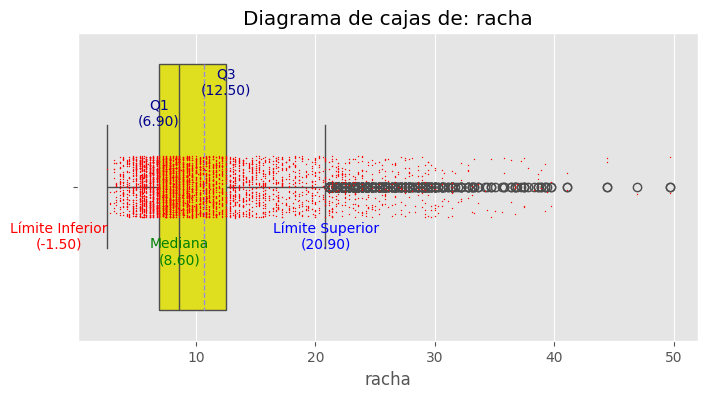

...

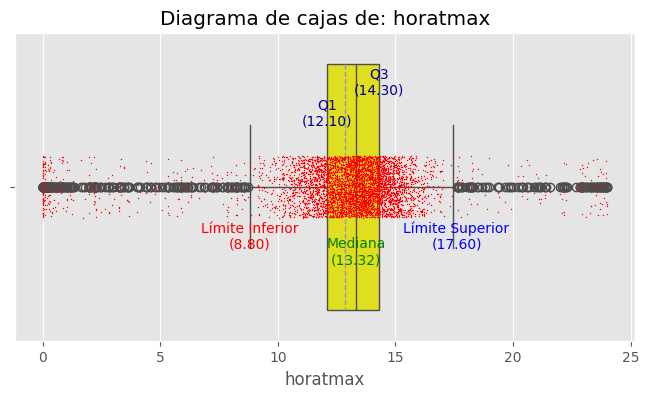

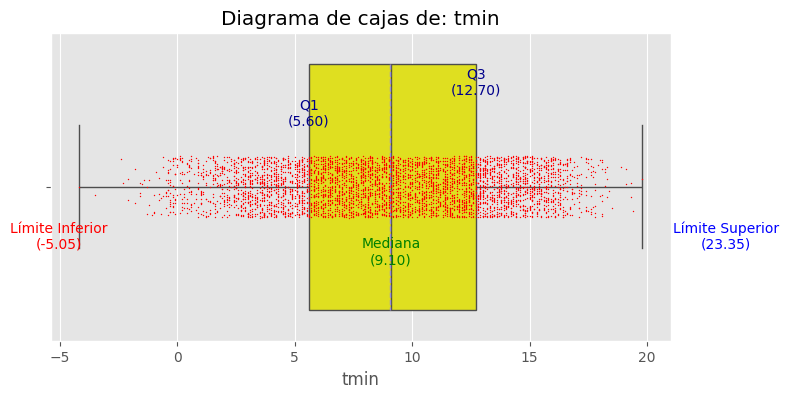

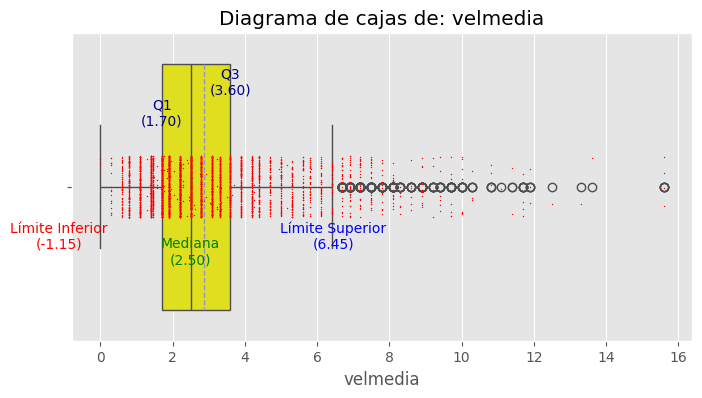

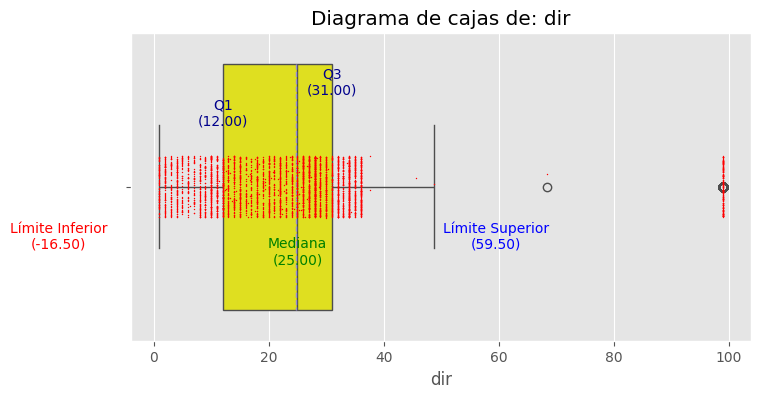

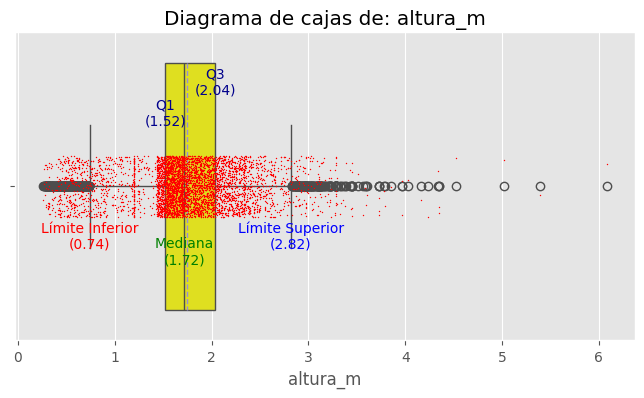

In [131]:
# elimino de la lista de variables numéricas enteras las que no son importantes respecto a outliars: year, week, city.
new_lista_variables = lista_variables[2:-1]
for variable in new_lista_variables:
  calculolimites(f'{variable}', dataset_asturias_cabrales)
  print('')

#### Gráficas Comparación variables

In [132]:
limite_inferior = 3

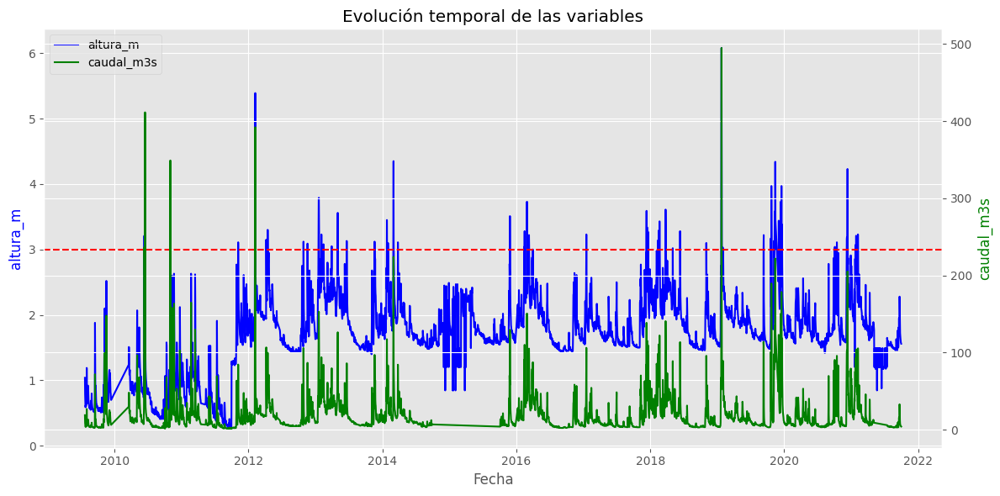

In [133]:
try:
    dataset_asturias_cabrales = dataset_asturias_cabrales.drop(columns=['index'])
except KeyError as kerr:
    pass
dataset_asturias_cabrales = dataset_asturias_cabrales.drop_duplicates().reset_index(drop=True)
grafico_comparacion_ggplot(dataset_asturias_cabrales, 'altura_m' ,'caudal_m3s', limite_inferior=limite_inferior)

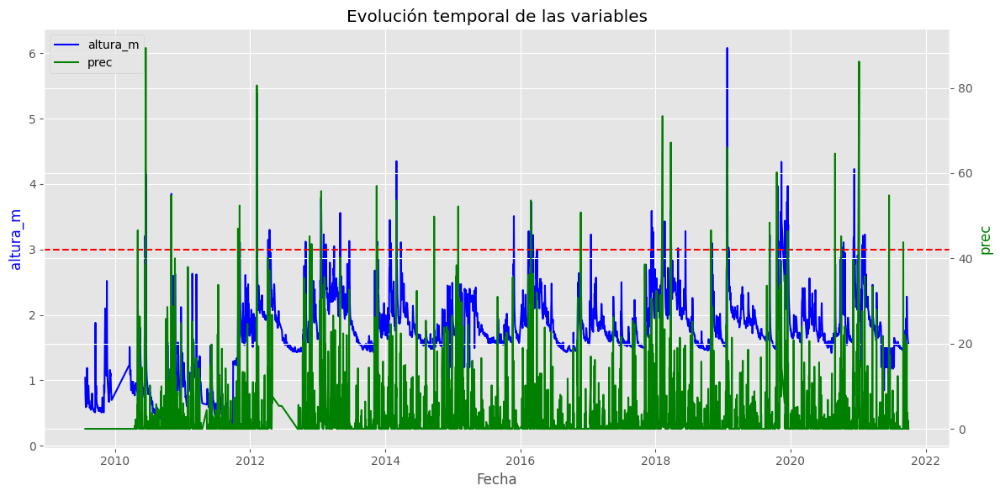

In [134]:
try:
    dataset_asturias_cabrales = dataset_asturias_cabrales.drop(columns=['index'])
except KeyError as kerr:
    pass
dataset_asturias_cabrales = dataset_asturias_cabrales.drop_duplicates().reset_index(drop=True)
grafico_comparacion_ggplot(dataset_asturias_cabrales, 'altura_m' ,'prec', limite_inferior=limite_inferior)

In [135]:
subdataset = dataset_asturias_cabrales[dataset_asturias_cabrales['altura_m'] > limite_inferior]
display(subdataset.head(20))

,indicativo,provincia,tmax,horaracha,hrMedia,altitud,prec,horatmin,racha,tmed,horatmax,nombre,fecha,tmin,velmedia,dir,altura_m,caudal_m3s
223,1179B,ASTURIAS,12.600000,2.333333,100.000000,458.0,16.2,6.400000,9.7,11.8,11.366667,CABRALES,2010-06-12,10.900000,3.9,30.0,3.21,236.824
227,1179B,ASTURIAS,15.100000,5.000000,89.000000,458.0,9.8,23.950000,16.4,11.9,13.950000,CABRALES,2010-06-16,8.700000,8.1,7.0,4.16,411.447
365,1179B,ASTURIAS,12.300000,0.666667,99.000000,458.0,14.8,3.000000,21.4,11.4,15.266667,CABRALES,2010-11-01,10.400000,6.1,32.0,3.85,349.078
712,1179B,ASTURIAS,9.700000,0.666667,93.000000,458.0,8.6,5.166667,14.4,8.4,12.066667,CABRALES,2011-11-06,7.200000,4.4,33.0,3.11,84.336
803,1179B,ASTURIAS,8.500000,11.166667,97.000000,458.0,48.8,0.016667,26.4,4.7,11.900000,CABRALES,2012-02-05,0.900000,7.2,33.0,3.20,161.154
804,1179B,ASTURIAS,8.800000,11.166667,100.000000,458.0,80.6,3.283333,16.7,6.7,12.516667,CABRALES,2012-02-06,4.600000,5.8,33.0,4.52,264.179
805,1179B,ASTURIAS,8.200000,4.833333,100.000000,458.0,6.4,23.833333,14.7,4.8,0.016667,CABRALES,2012-02-07,1.400000,3.6,34.0,5.39,392.113
806,1179B,ASTURIAS,1.500000,9.166667,97.000000,458.0,7.0,23.750000,9.2,0.6,0.016667,CABRALES,2012-02-08,-0.400000,3.3,12.0,3.29,100.952
865,1179B,ASTURIAS,8.000000,16.666667,100.000000,458.0,17.0,23.233333,11.4,6.6,9.966667,CABRALES,2012-04-07,5.300000,3.1,36.0,3.15,106.597
873,1179B,ASTURIAS,7.466667,2.000000,92.666667,458.0,29.4,3.442593,18.9,4.6,13.950000,CABRALES,2012-04-15,1.733333,4.2,35.0,3.30,99.617


#### Histograma

In [95]:
lista_numericas = dataset_asturias_cabrales.select_dtypes(include=[np.number]).columns.to_list()

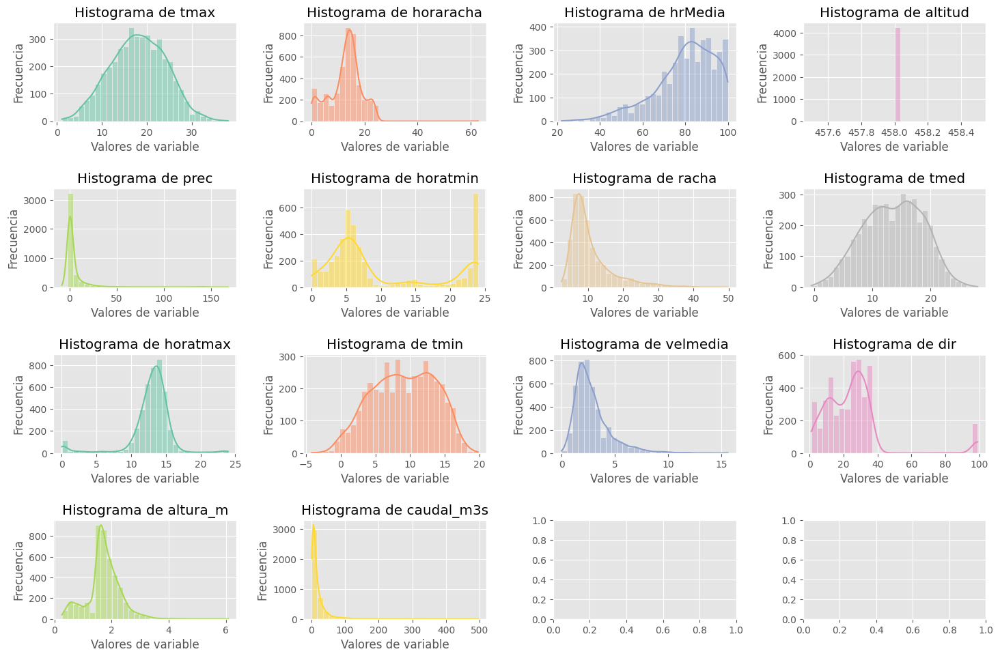

In [96]:
histogramas(dataset_asturias_cabrales[lista_numericas])

#### Diagrama de dispersión

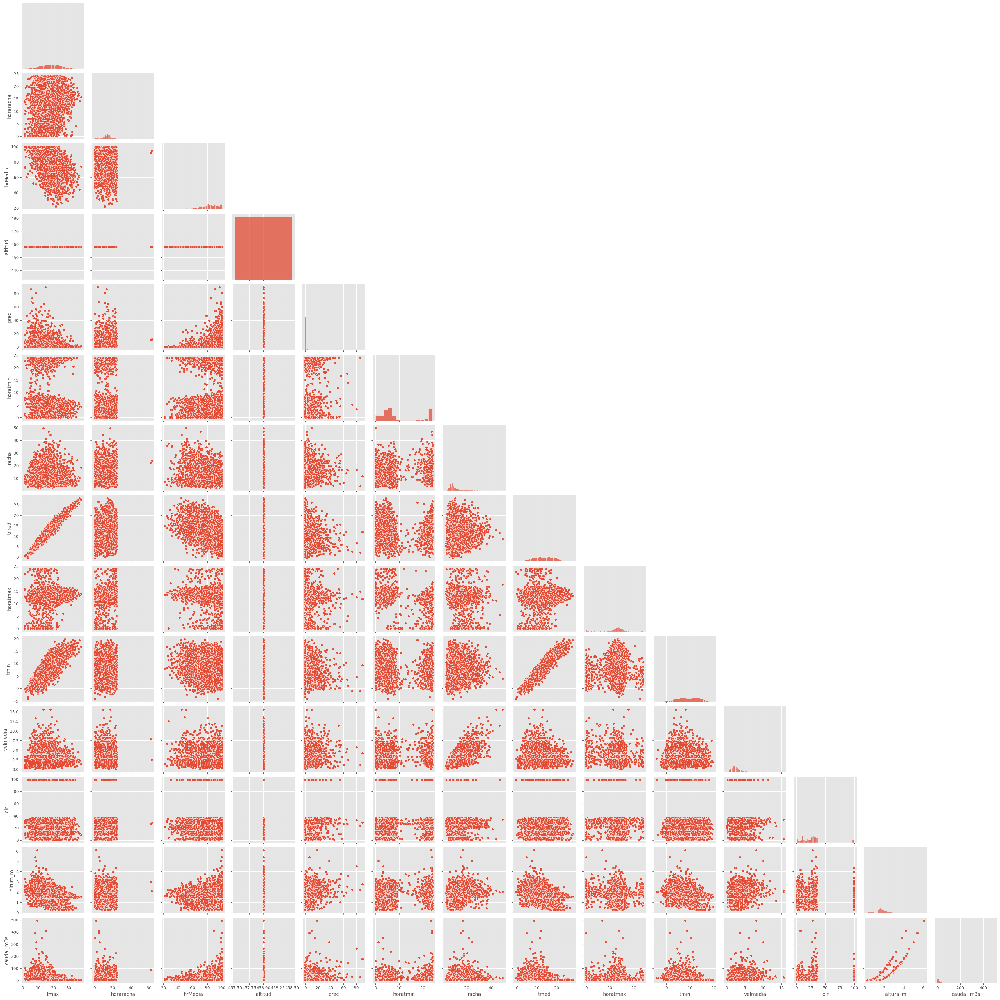

In [ ]:
# diagrama de dispersión
sns.pairplot(dataset_asturias_cabrales[lista_numericas], corner=True)
plt.show()

#### Correlaciones

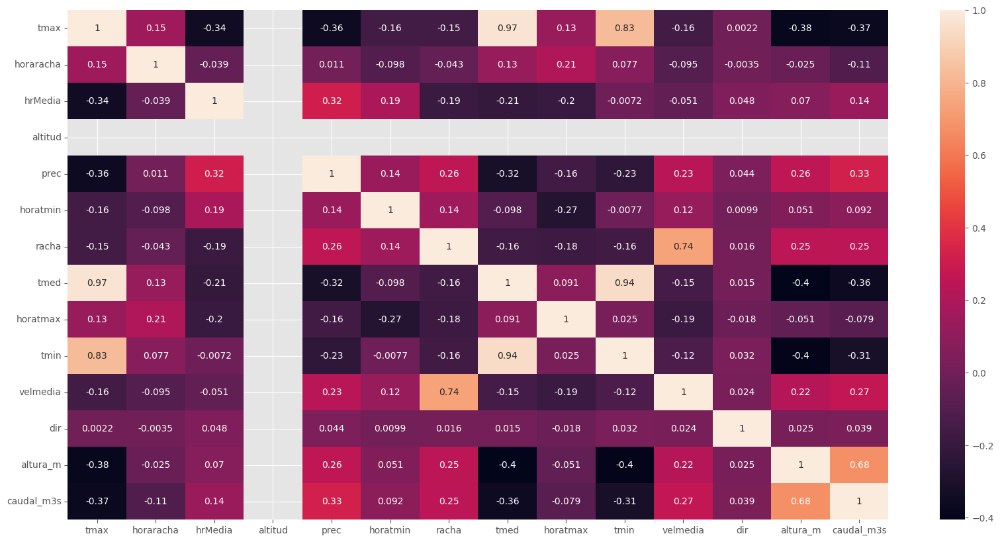

In [136]:
correlacion(dataset_asturias_cabrales[lista_numericas])

#### Discretización valores altura

In [137]:
maximo = dataset_asturias_cabrales['altura_m'].max()
maximo

6.08

In [138]:
# Definir los intervalos que se asignarán a cada valor discreto entre 1 y 10
bins = np.linspace(dataset_asturias_cabrales['altura_m'].min(), dataset_asturias_cabrales['altura_m'].max(), 65)  # 10 intervalos
# Etiquetas discretas (1 a 10)
etiquetas = np.arange(1, 65)

# Discretizar los valores de la columna 'altura_m'
dataset_asturias_cabrales['altura_m_discreta'] = pd.cut(dataset_asturias_cabrales['altura_m'], bins=bins, labels=etiquetas, include_lowest=True)
display(dataset_asturias_cabrales.sample(3))

,indicativo,provincia,tmax,horaracha,hrMedia,altitud,prec,horatmin,racha,tmed,horatmax,nombre,fecha,tmin,velmedia,dir,altura_m,caudal_m3s,altura_m_discreta
3105,1179B,ASTURIAS,26.6,13.166667,92.0,458.0,0.6,5.050000,6.1,21.5,11.616667,CABRALES,2018-07-08,16.4,2.5,14.0,1.74,8.056,17
244,1179B,ASTURIAS,20.6,21.000000,97.0,458.0,0.8,23.883333,6.7,18.0,10.933333,CABRALES,2010-07-03,15.3,1.9,11.0,0.88,15.133,7
2724,1179B,ASTURIAS,35.2,15.000000,54.0,458.0,0.0,23.966667,7.8,26.8,13.066667,CABRALES,2017-06-21,18.3,0.8,26.0,1.57,4.254,15


In [139]:
display(dataset_asturias_cabrales.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4251 entries, 0 to 4250
Data columns (total 19 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   indicativo         4251 non-null   object        
 1   provincia          4251 non-null   object        
 2   tmax               4251 non-null   float64       
 3   horaracha          4251 non-null   float64       
 4   hrMedia            4251 non-null   float64       
 5   altitud            4251 non-null   float64       
 6   prec               4251 non-null   float64       
 7   horatmin           4251 non-null   float64       
 8   racha              4251 non-null   float64       
 9   tmed               4251 non-null   float64       
 10  horatmax           4251 non-null   float64       
 11  nombre             4251 non-null   object        
 12  fecha              4251 non-null   datetime64[ns]
 13  tmin               4251 non-null   float64       
 14  velmedia

None

#### Guardo antes de Normalización

In [140]:
datasetcsv_cabrales = "./drive/MyDrive/MASTER_BIG_DATA/14_TFM/scripts/csv/dataset_asturias_cabrales.csv"
dataset_asturias_cabrales.to_csv(datasetcsv_cabrales, index=False, encoding="utf-8")

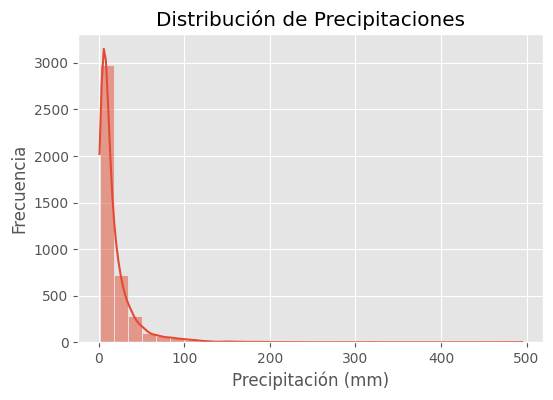

In [108]:
# Distribución de Precipitaciones
plt.figure(figsize=(6, 4))
sns.histplot(dataset_asturias_cabrales["caudal_m3s"], bins=30, kde=True)
plt.title("Distribución de Precipitaciones")
plt.xlabel("Precipitación (mm)")
plt.ylabel("Frecuencia")
plt.show()

#### Normalización

In [ ]:
# Normalizo el dataframe transpuesto para estudio de matriz de similitud
from sklearn import preprocessing
min_max_scaler = preprocessing.MinMaxScaler()
dataset_asturias_cabrales_norm = dataset_asturias_cabrales[lista_numericas].copy()
dataset_asturias_cabrales_norm = min_max_scaler.fit_transform(dataset_asturias_cabrales_norm)

In [ ]:
dataset_asturias_cabrales_norm = pd.DataFrame(dataset_asturias_cabrales_norm,
                                              columns=lista_numericas,
                                              index=dataset_asturias_cabrales.index)

#### Guardo después de Normalización

In [ ]:
datasetcsv_cabrales_norm = "/home/miguel/Documentos/MASTER_BIG_DATA/14_TFM/csv/dataset_asturias_cabrales_norm.csv"
dataset_asturias_cabrales_norm.to_csv(datasetcsv_cabrales_norm, index=False, encoding="utf-8")

### LLANES

#### Estudio nan

<class 'pandas.core.frame.DataFrame'>
Index: 12251 entries, 37425 to 236192
Data columns (total 20 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   index              12251 non-null  int64         
 1   indicativo         12251 non-null  object        
 2   provincia          12251 non-null  object        
 3   tmax               11826 non-null  float64       
 4   horaracha          11083 non-null  float64       
 5   hrMedia            7964 non-null   float64       
 6   altitud            12251 non-null  int64         
 7   prec               11452 non-null  float64       
 8   horatmin           10585 non-null  float64       
 9   racha              11667 non-null  float64       
 10  tmed               11826 non-null  float64       
 11  horatmax           10926 non-null  float64       
 12  nombre             12251 non-null  object        
 13  fecha              12251 non-null  datetime64[ns]
 14  tmin  

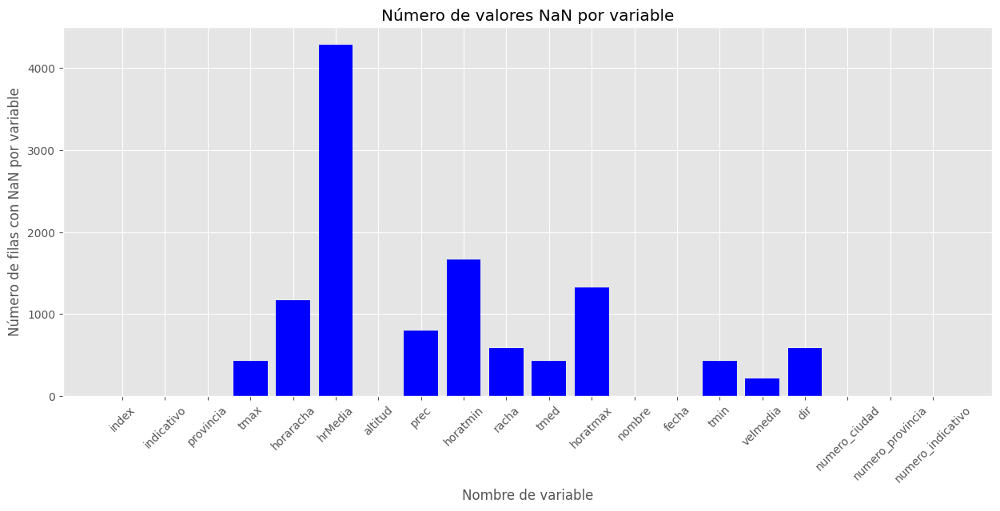

In [ ]:
ciudades_filtradas = ['LLANES']
dataset_asturias_llanes = dataset_asturias[dataset_asturias['nombre'].isin(ciudades_filtradas)]
dataset_asturias_llanes.info()
imprimir_nan(dataset_asturias_llanes)

In [ ]:
display(dataset_asturias_llanes.describe())

,index,tmax,horaracha,hrMedia,altitud,prec,horatmin,racha,tmed,horatmax,fecha,tmin,velmedia,dir,numero_ciudad,numero_provincia,numero_indicativo
count,12251.000000,11826.000000,11083.000000,7964.000000,12251.0,11452.000000,10585.000000,11667.000000,11826.000000,10926.000000,12251,11826.000000,12036.000000,11667.000000,12251.0,12251.0,12251.0
mean,117721.527467,17.761136,12.876584,75.792692,10.0,3.034160,10.084045,9.141459,14.739625,12.805369,2009-10-10 03:43:40.879928064,11.717377,2.444458,24.431731,15.0,0.0,2.0
min,45247.000000,5.200000,0.000000,32.000000,10.0,0.000000,0.000000,2.500000,3.000000,0.000000,1997-04-02 00:00:00,-0.500000,0.000000,1.000000,15.0,0.0,2.0
25%,68529.000000,14.500000,9.166667,70.000000,10.0,0.000000,4.000000,5.800000,11.600000,11.666667,2002-09-06 12:00:00,8.425000,1.400000,10.000000,15.0,0.0,2.0
50%,93468.000000,17.700000,13.333333,76.000000,10.0,0.000000,6.000000,8.100000,14.600000,13.166667,2008-08-29 00:00:00,11.600000,2.200000,27.000000,15.0,0.0,2.0
75%,166044.500000,21.100000,17.166667,82.000000,10.0,2.600000,21.666667,11.400000,18.200000,14.416667,2016-08-02 00:00:00,15.300000,3.100000,30.000000,15.0,0.0,2.0
max,244014.000000,37.600000,78.166667,98.000000,10.0,120.000000,23.983333,33.600000,29.000000,23.983333,2024-11-17 00:00:00,22.500000,11.100000,99.000000,15.0,0.0,2.0
std,59122.486891,4.267339,6.447457,9.163375,0.0,6.958609,8.584192,4.359195,4.104151,3.423111,NaN,4.240218,1.402677,18.165577,0.0,0.0,0.0


In [ ]:
# Imputación usando KNN
imputer = KNNImputer(n_neighbors=3)
dataset_asturias_llanes[[

    'tmax', 'horaracha', 'hrMedia', 'altitud', 'prec', 'horatmin', 'racha',
    'tmed', 'horatmax', 'tmin', 'velmedia', 'dir']] = imputer.fit_transform(dataset_asturias_llanes[[

    'tmax', 'horaracha', 'hrMedia', 'altitud', 'prec', 'horatmin', 'racha',
    'tmed', 'horatmax', 'tmin', 'velmedia', 'dir']])

/tmp/ipykernel_10498/1242501763.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset_asturias_llanes[[


#### Outliers

In [ ]:
#muestro columnas con datos numericos
lista_variables = dataset_asturias_llanes.select_dtypes(include=np.number).columns
lista_variables.tolist()

['index',
 'tmax',
 'horaracha',
 'hrMedia',
 'altitud',
 'prec',
 'horatmin',
 'racha',
 'tmed',
 'horatmax',
 'tmin',
 'velmedia',
 'dir',
 'numero_ciudad',
 'numero_provincia',
 'numero_indicativo']

In [ ]:
outliers = detectar_outliers_RI(dataset_asturias_llanes)
display(outliers)

index
limite inferior: -77744.25
limite superior: 312317.75
número de outliers: 0 

tmax
limite inferior: 4.75
limite superior: 30.75
número de outliers: 5 

horaracha
limite inferior: -2.0000000000000018
limite superior: 28.66666666666667
número de outliers: 127 

hrMedia
limite inferior: 57.49999999999999
limite superior: 96.16666666666669
número de outliers: 250 

altitud
limite inferior: 10.0
limite superior: 10.0
número de outliers: 0 

prec
limite inferior: -5.25
limite superior: 8.75
número de outliers: 1802 

horatmin
limite inferior: -19.583333333333332
limite superior: 43.75
número de outliers: 0 

racha
limite inferior: -1.8500000000000014
limite superior: 19.35
número de outliers: 479 

tmed
limite inferior: 1.7666666666666604
limite superior: 27.900000000000006
número de outliers: 1 

horatmax
limite inferior: 7.666666666666664
limite superior: 18.333333333333336
número de outliers: 935 

tmin
limite inferior: -1.799999999999999
limite superior: 25.4
número de outliers: 0 

{'numero_indicativo': Series([], Name: numero_indicativo, dtype: int64)}

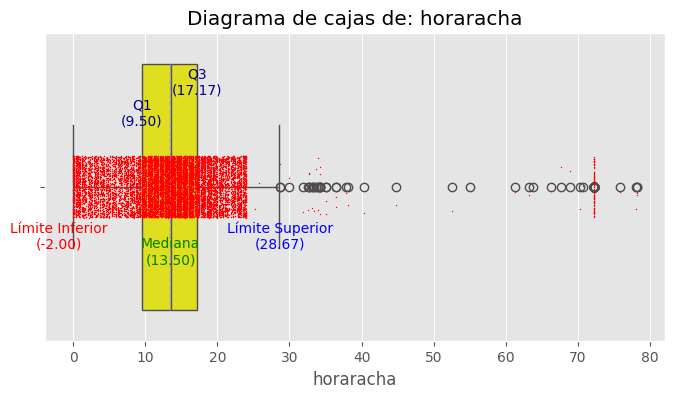

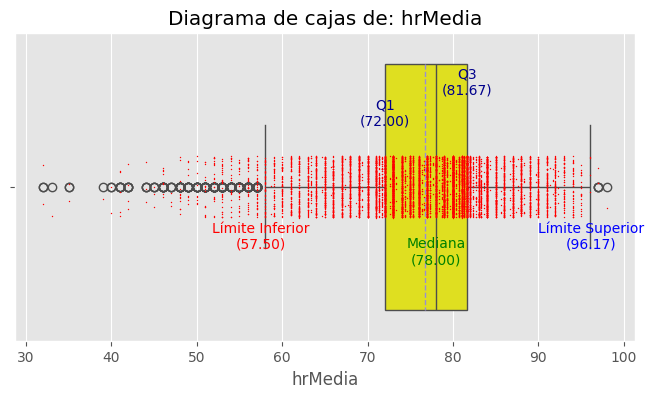

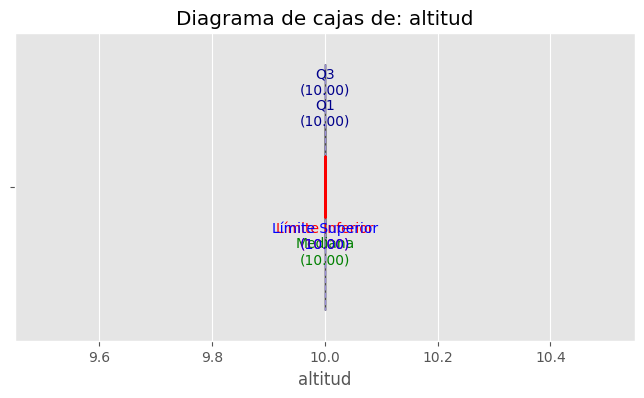

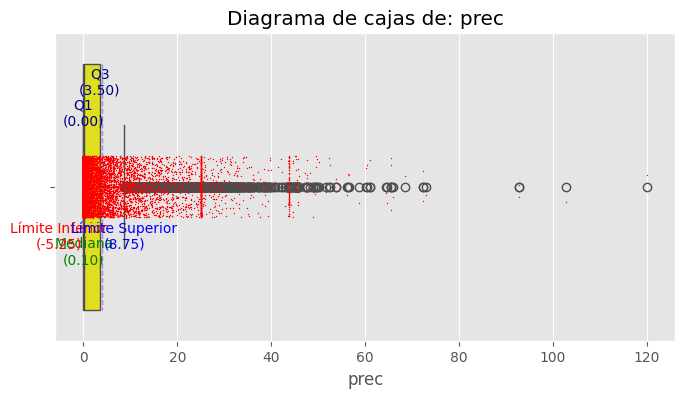

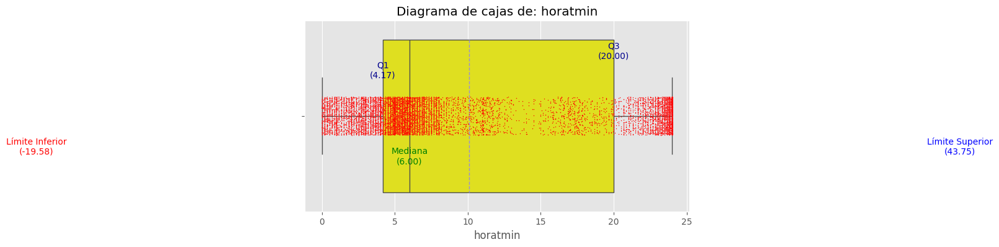

...

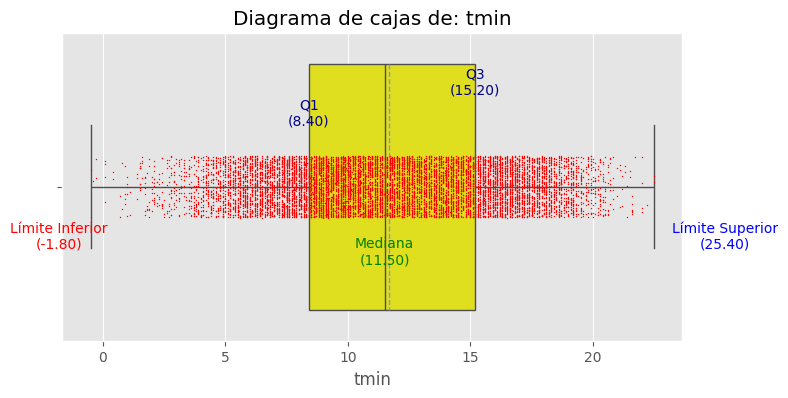

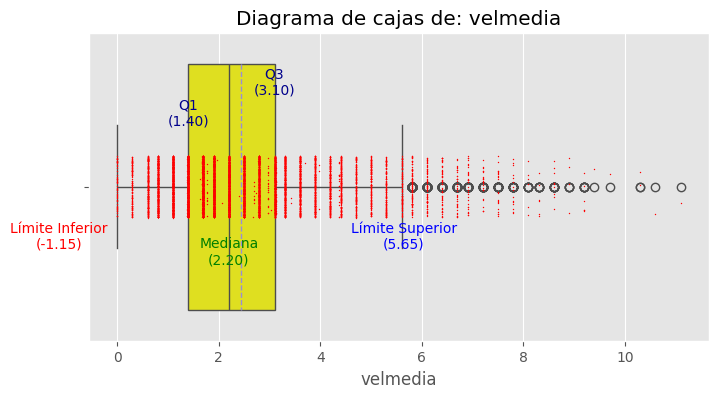

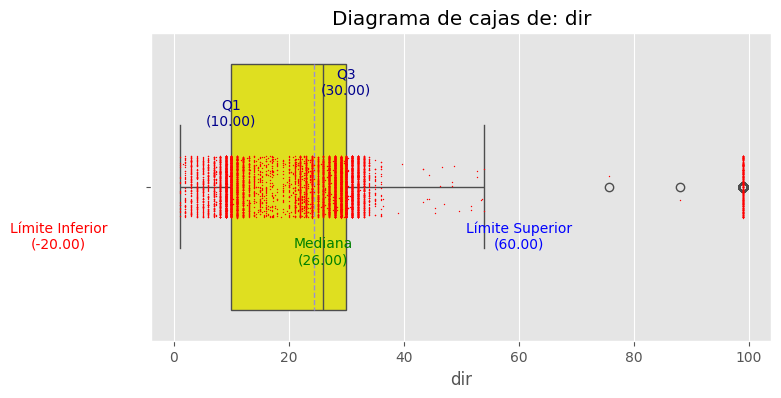

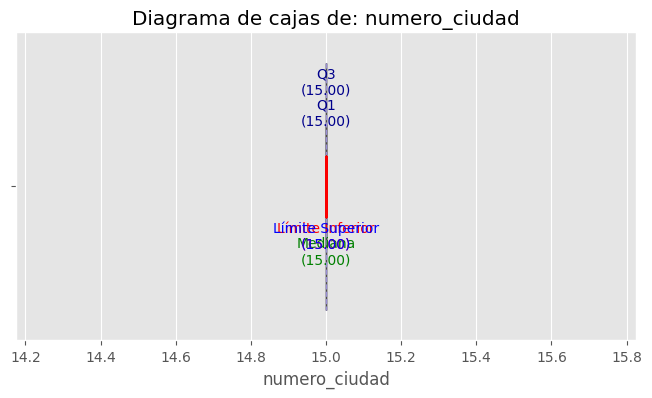

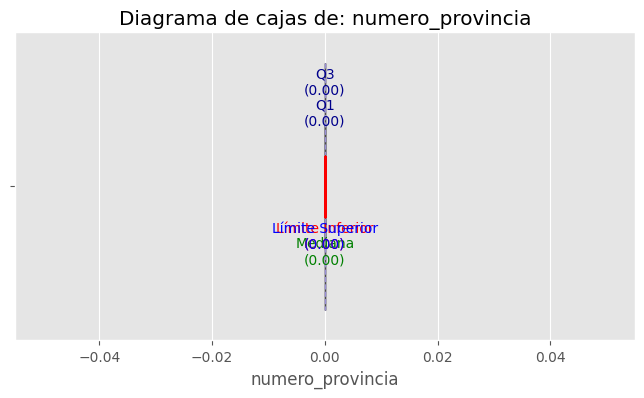

In [ ]:
# elimino de la lista de variables numéricas enteras las que no son importantes respecto a outliars: year, week, city.
new_lista_variables = lista_variables[2:-1]
for variable in new_lista_variables:
  calculolimites(f'{variable}', dataset_asturias_llanes)
  print('')

#### Grafica Precipitaciones

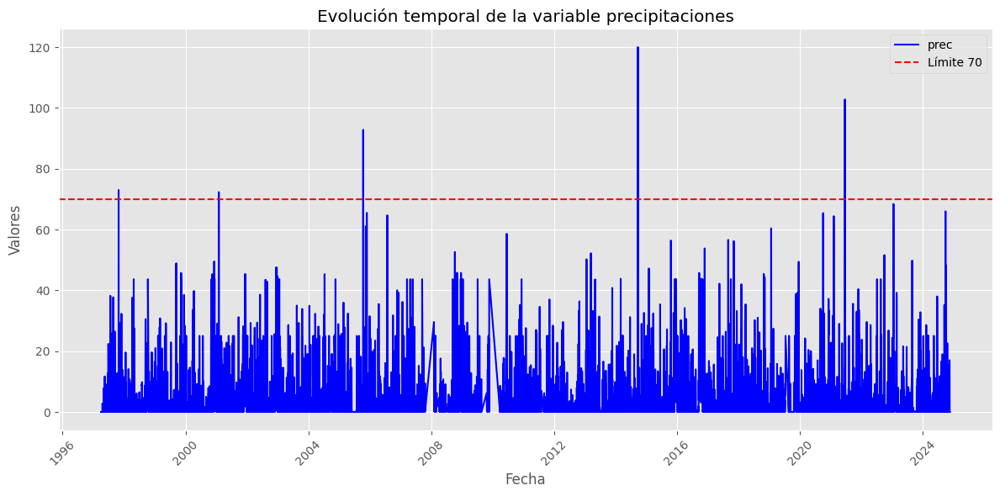

In [ ]:
try:
    dataset_asturias_llanes = dataset_asturias_llanes.drop(columns=['index'])
except KeyError as kerr:
    pass
dataset_asturias_llanes = dataset_asturias_llanes.drop_duplicates().reset_index(drop=True)
grafico_individual_ggplot(dataset_asturias_llanes, 'prec', limite_inferior=70)

In [ ]:
subdataset = dataset_asturias_llanes[dataset_asturias_llanes['prec'] > limite_inferior]
display(subdataset.head(20))

,indicativo,provincia,tmax,horaracha,hrMedia,altitud,prec,horatmin,racha,tmed,horatmax,nombre,fecha,tmin,velmedia,dir,numero_ciudad,numero_provincia,numero_indicativo
33,1183X,ASTURIAS,19.7,18.166667,89.0,10.0,5.0,18.416667,22.2,15.4,14.500000,LLANES,1997-05-05,11.2,3.3,29.0,15,0,2
34,1183X,ASTURIAS,14.5,3.500000,84.0,10.0,7.9,10.833333,20.0,12.4,0.500000,LLANES,1997-05-06,10.2,4.2,26.0,15,0,2
35,1183X,ASTURIAS,12.5,16.166667,85.0,10.0,5.6,16.166667,21.7,10.0,15.166667,LLANES,1997-05-07,7.5,4.2,29.0,15,0,2
44,1183X,ASTURIAS,18.4,19.500000,92.0,10.0,11.7,5.833333,5.8,16.1,14.666667,LLANES,1997-05-16,13.8,1.4,22.0,15,0,2
54,1183X,ASTURIAS,23.4,18.166667,84.0,10.0,7.9,5.000000,13.6,19.5,10.166667,LLANES,1997-05-26,15.6,2.8,11.0,15,0,2
59,1183X,ASTURIAS,20.5,18.833333,93.0,10.0,9.1,23.983333,6.7,18.4,10.333333,LLANES,1997-05-31,16.2,1.4,20.0,15,0,2
61,1183X,ASTURIAS,18.7,15.666667,90.0,10.0,3.5,4.500000,3.3,15.8,11.000000,LLANES,1997-06-02,12.8,1.4,10.0,15,0,2
63,1183X,ASTURIAS,18.0,23.166667,93.0,10.0,7.1,15.194444,6.1,17.2,11.555556,LLANES,1997-06-04,16.5,1.9,28.0,15,0,2
72,1183X,ASTURIAS,22.0,5.833333,93.0,10.0,5.0,19.444444,7.2,19.6,11.166667,LLANES,1997-06-13,17.2,2.5,27.0,15,0,2
79,1183X,ASTURIAS,22.4,22.833333,79.0,10.0,3.4,4.666667,8.6,18.6,12.555556,LLANES,1997-06-20,14.7,1.9,31.0,15,0,2


#### Histograma

In [ ]:
lista_numericas = dataset_asturias_llanes.select_dtypes(include=[np.number]).columns.to_list()

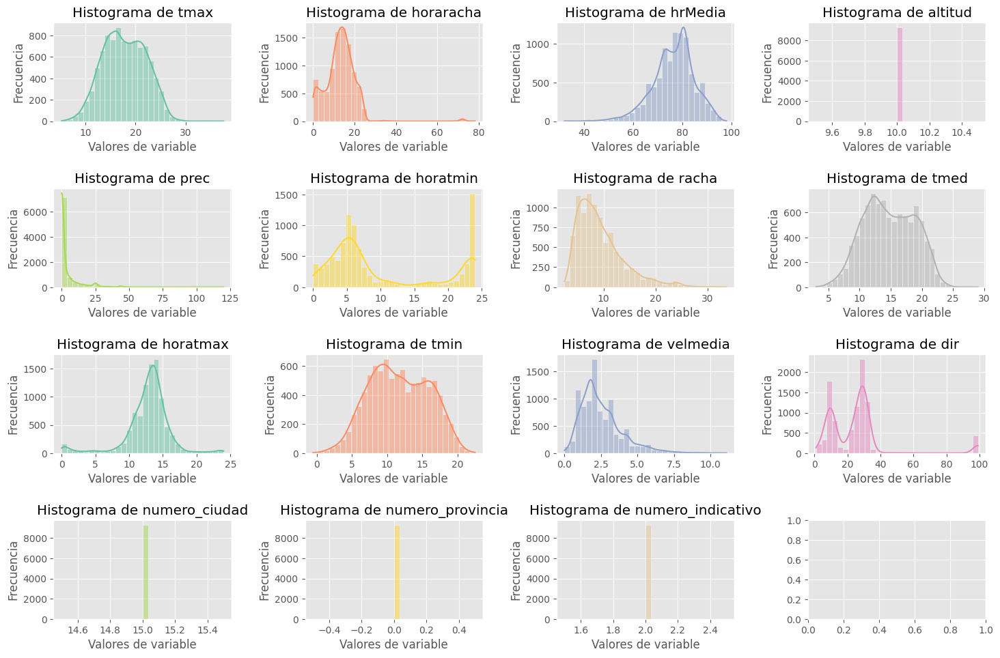

In [ ]:
histogramas(dataset_asturias_llanes[lista_numericas])

#### Diagrama de dispersión

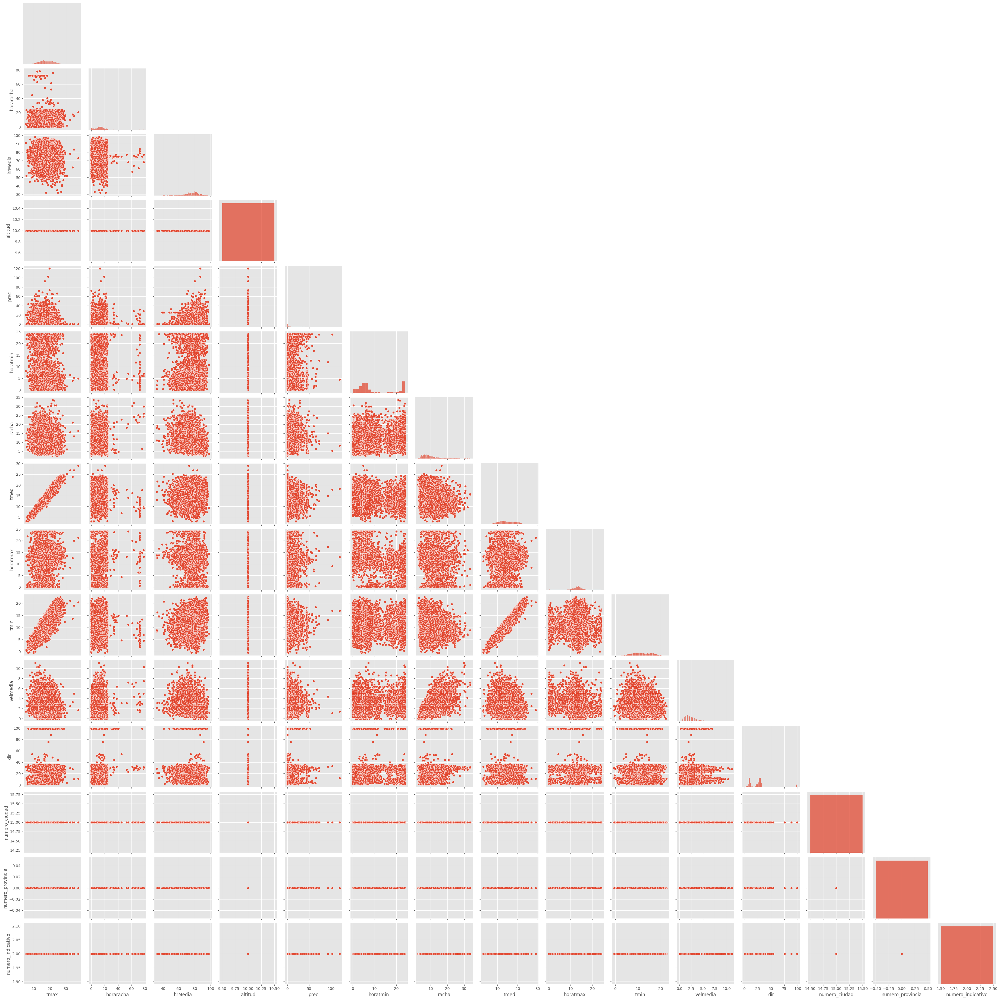

In [ ]:
# diagrama de dispersión
sns.pairplot(dataset_asturias_llanes[lista_numericas], corner=True)
plt.show()

#### Correlaciones

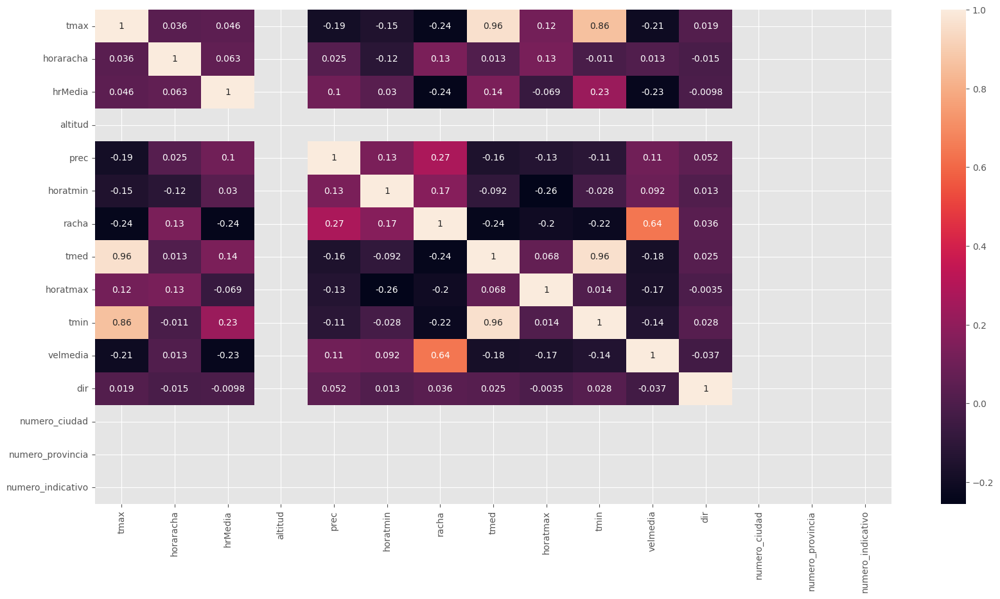

In [ ]:
correlacion(dataset_asturias_llanes[lista_numericas])

#### Discretización valores altura

In [ ]:
maximo = dataset_asturias_adataset_asturias_llanesmieva['altura_m'].max()
maximo

6.08

In [ ]:
# Definir los intervalos que se asignarán a cada valor discreto entre 1 y 10
bins = np.linspace(dataset_asturias_llanes['altura_m'].min(), dataset_asturias_llanes['altura_m'].max(), 65)  # 10 intervalos
# Etiquetas discretas (1 a 10)
etiquetas = np.arange(1, 65)

# Discretizar los valores de la columna 'altura_m'
dataset_asturias_llanes['altura_m_discreta'] = pd.cut(dataset_asturias_llanes['altura_m'], bins=bins, labels=etiquetas, include_lowest=True)
display(dataset_asturias_llanes.sample(3))

,index,indicativo,provincia,tmax,horaracha,hrMedia,altitud,prec,horatmin,racha,...,tmin,velmedia,dir,numero_ciudad,numero_provincia,numero_indicativo,estacion,altura_m,caudal_m3s,altura_m_discreta
5131,209290,1186P,ASTURIAS,20.1,9.333333,55.0,370,0.0,6.050000,15.3,...,16.7,5.8,10.0,1,0,3,1295,2.31,34.149,23
4259,187638,1186P,ASTURIAS,24.2,12.333333,83.0,370,0.0,3.833333,6.1,...,15.0,1.4,26.0,1,0,3,1295,1.89,12.850,18
3614,171677,1186P,ASTURIAS,16.9,12.000000,94.0,370,0.2,6.616667,4.4,...,13.4,0.8,28.0,1,0,3,1295,1.45,NaN,14


In [ ]:
display(dataset_asturias_amieva.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5414 entries, 0 to 5413
Data columns (total 19 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   index       5414 non-null   int64         
 1   indicativo  5414 non-null   object        
 2   provincia   5414 non-null   object        
 3   tmax        5414 non-null   float64       
 4   horaracha   5414 non-null   float64       
 5   hrMedia     5414 non-null   float64       
 6   altitud     5414 non-null   float64       
 7   prec        5414 non-null   float64       
 8   horatmin    5414 non-null   float64       
 9   racha       5414 non-null   float64       
 10  tmed        5414 non-null   float64       
 11  horatmax    5414 non-null   float64       
 12  nombre      5414 non-null   object        
 13  fecha       5414 non-null   datetime64[ns]
 14  tmin        5414 non-null   float64       
 15  velmedia    5414 non-null   float64       
 16  dir         5414 non-nul

None

#### Guardo antes de Normalización

In [ ]:
datasetcsv_llanes = "/home/miguel/Documentos/MASTER_BIG_DATA/14_TFM/csv/dataset_asturias_llanes.csv"
dataset_asturias_llanes.to_csv(datasetcsv_llanes, index=False, encoding="utf-8")

### PILOÑA, BARGAÉU

#### Estudio nan

<class 'pandas.core.frame.DataFrame'>
Index: 6495 entries, 84476 to 236212
Data columns (total 20 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   index              6495 non-null   int64         
 1   indicativo         6495 non-null   object        
 2   provincia          6495 non-null   object        
 3   tmax               6442 non-null   float64       
 4   horaracha          6080 non-null   float64       
 5   hrMedia            6476 non-null   float64       
 6   altitud            6495 non-null   int64         
 7   prec               6020 non-null   float64       
 8   horatmin           5517 non-null   float64       
 9   racha              6423 non-null   float64       
 10  tmed               6442 non-null   float64       
 11  horatmax           6286 non-null   float64       
 12  nombre             6495 non-null   object        
 13  fecha              6495 non-null   datetime64[ns]
 14  tmin   

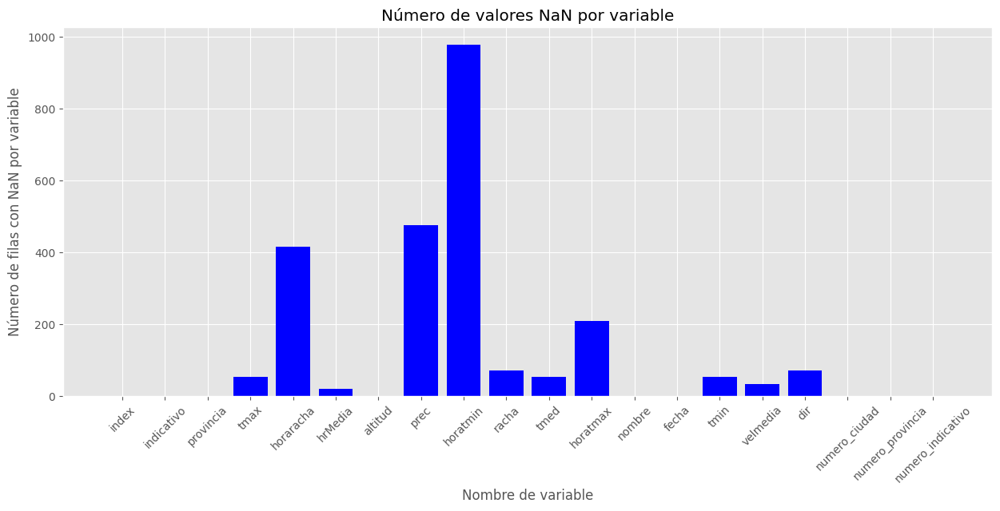

In [ ]:
ciudades_filtradas = ['PILOÑA, BARGAÉU']
dataset_asturias_piloña = dataset_asturias[dataset_asturias['nombre'].isin(ciudades_filtradas)]
dataset_asturias_piloña.info()
imprimir_nan(dataset_asturias_piloña)

In [ ]:
display(dataset_asturias_piloña.describe())

,index,tmax,horaracha,hrMedia,altitud,prec,horatmin,racha,tmed,horatmax,fecha,tmin,velmedia,dir,numero_ciudad,numero_provincia,numero_indicativo
count,6495.000000,6442.000000,6080.000000,6476.000000,6495.0,6020.000000,5517.000000,6423.000000,6442.000000,6286.000000,6495,6442.000000,6462.000000,6423.000000,6495.0,6495.0,6495.0
mean,164337.833102,18.442518,13.300436,81.656733,280.0,3.539518,9.702628,6.987576,13.471981,13.010391,2016-07-20 14:06:02.494226432,8.501071,1.258805,20.232135,19.0,0.0,4.0
min,92298.000000,0.800000,0.166667,30.000000,280.0,0.000000,0.000000,0.600000,-2.700000,0.000000,2008-05-28 00:00:00,-6.200000,0.000000,1.000000,19.0,0.0,4.0
25%,123642.000000,14.400000,11.833333,77.000000,280.0,0.000000,4.850000,5.300000,9.600000,12.150000,2012-12-13 12:00:00,4.600000,0.800000,4.000000,19.0,0.0,4.0
50%,163287.000000,18.600000,13.666667,83.000000,280.0,0.200000,6.183333,6.400000,13.600000,13.333333,2016-06-05 00:00:00,8.600000,1.100000,10.000000,19.0,0.0,4.0
75%,203590.500000,22.600000,15.333333,89.000000,280.0,3.000000,11.100000,7.800000,17.400000,14.433333,2020-05-07 12:00:00,12.600000,1.700000,28.000000,19.0,0.0,4.0
max,244034.000000,40.500000,23.983333,100.000000,280.0,85.000000,24.000000,27.800000,29.200000,24.000000,2024-11-17 00:00:00,20.000000,8.300000,99.000000,19.0,0.0,4.0
std,45216.158556,5.702975,4.294009,10.086896,0.0,7.991477,8.075555,3.048278,4.990416,2.778648,NaN,5.080205,0.713690,24.175108,0.0,0.0,0.0


In [ ]:
#dataset_asturias_piloña = dataset_asturias_piloña.drop(columns=['sol', 'presMin', 'horaPresMin', 'presMax', 'horaPresMax'])

In [ ]:
# Imputación usando KNN
#imputer = KNNImputer(n_neighbors=3)
dataset_asturias_piloña[[
    'tmax', 'horaracha', 'hrMedia', 'altitud', 'prec', 'horatmin', 'racha',
    'tmed', 'horatmax', 'tmin', 'velmedia', 'dir']] = imputer.fit_transform(dataset_asturias_piloña[[
    'tmax', 'horaracha', 'hrMedia', 'altitud', 'prec', 'horatmin', 'racha',
    'tmed', 'horatmax', 'tmin', 'velmedia', 'dir']])

/tmp/ipykernel_10498/273694717.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset_asturias_piloña[[


#### Outliers

In [ ]:
#muestro columnas con datos numericos
lista_variables = dataset_asturias_piloña.select_dtypes(include=np.number).columns
lista_variables.tolist()

['index',
 'tmax',
 'horaracha',
 'hrMedia',
 'altitud',
 'prec',
 'horatmin',
 'racha',
 'tmed',
 'horatmax',
 'tmin',
 'velmedia',
 'dir',
 'numero_ciudad',
 'numero_provincia',
 'numero_indicativo']

In [ ]:
outliers = detectar_outliers_RI(dataset_asturias_piloña)
display(outliers)

index
limite inferior: 3719.25
limite superior: 323513.25
número de outliers: 0 

tmax
limite inferior: 2.0999999999999996
limite superior: 34.900000000000006
número de outliers: 10 

horaracha
limite inferior: 6.583333333333334
limite superior: 20.583333333333336
número de outliers: 777 

hrMedia
limite inferior: 59.0
limite superior: 107.0
número de outliers: 206 

altitud
limite inferior: 280.0
limite superior: 280.0
número de outliers: 0 

prec
limite inferior: -3.9000000000000004
limite superior: 6.5
número de outliers: 984 

horatmin
limite inferior: -7.087499999999999
limite superior: 24.96805555555555
número de outliers: 0 

racha
limite inferior: 1.5499999999999998
limite superior: 11.55
número de outliers: 538 

tmed
limite inferior: -2.0999999999999996
limite superior: 29.099999999999998
número de outliers: 2 

horatmax
limite inferior: 8.750000000000002
limite superior: 17.816666666666663
número de outliers: 323 

tmin
limite inferior: -7.4
limite superior: 24.6
número de o

{'numero_indicativo': Series([], Name: numero_indicativo, dtype: int64)}

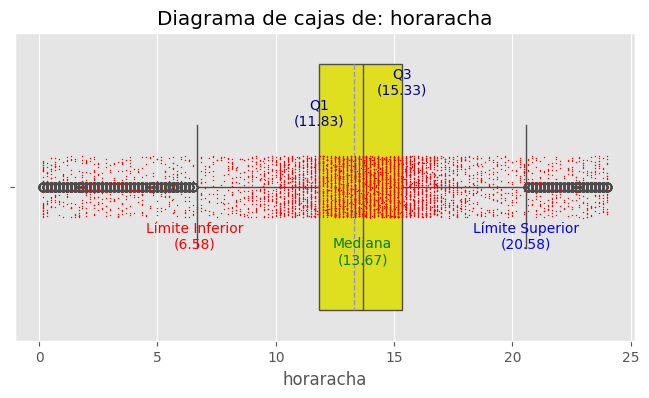

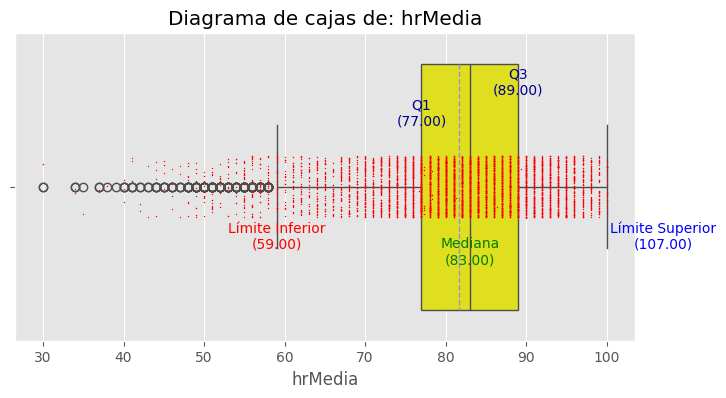

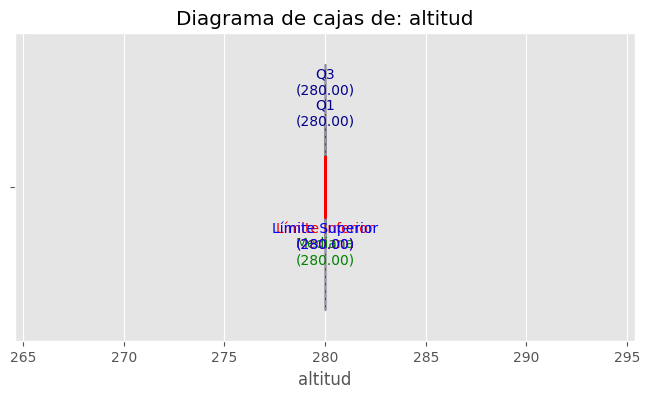

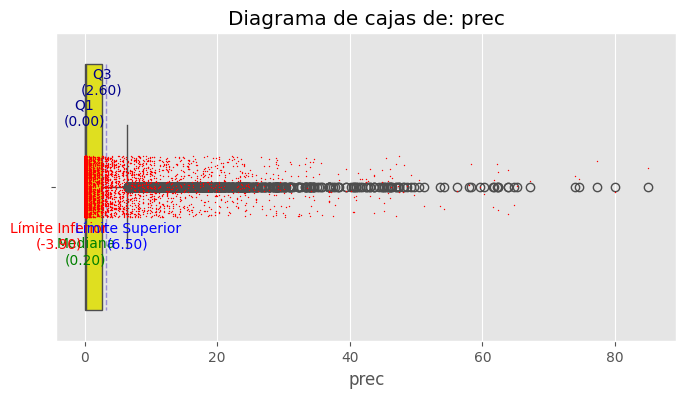

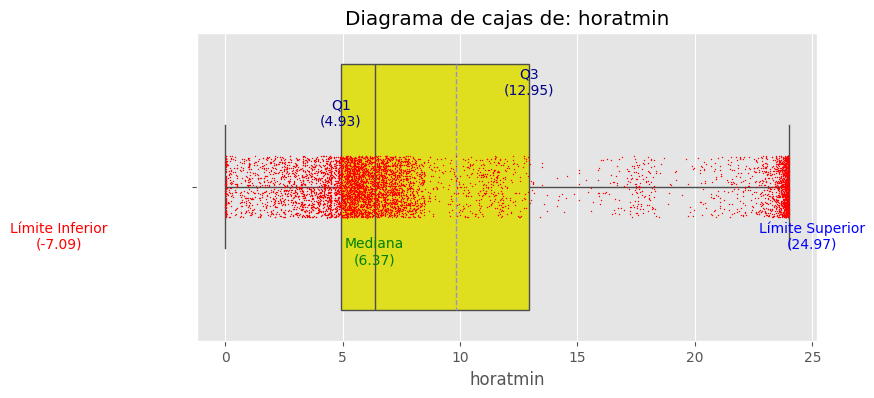

...

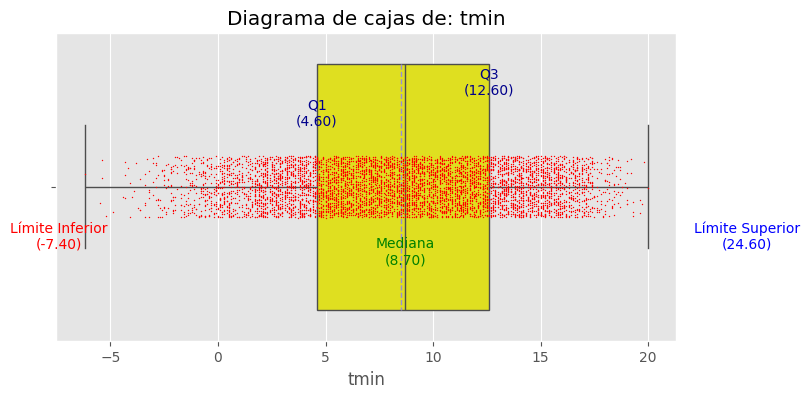

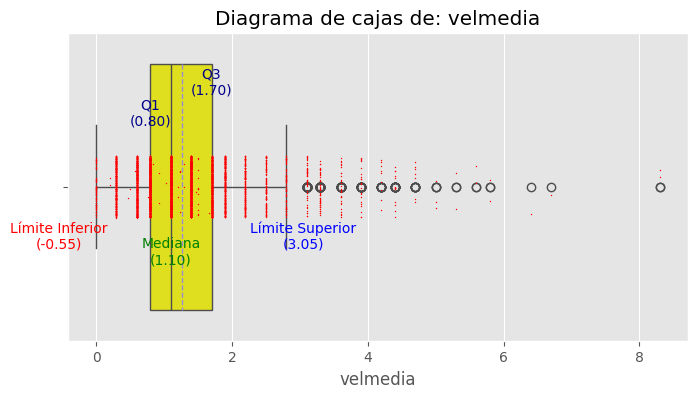

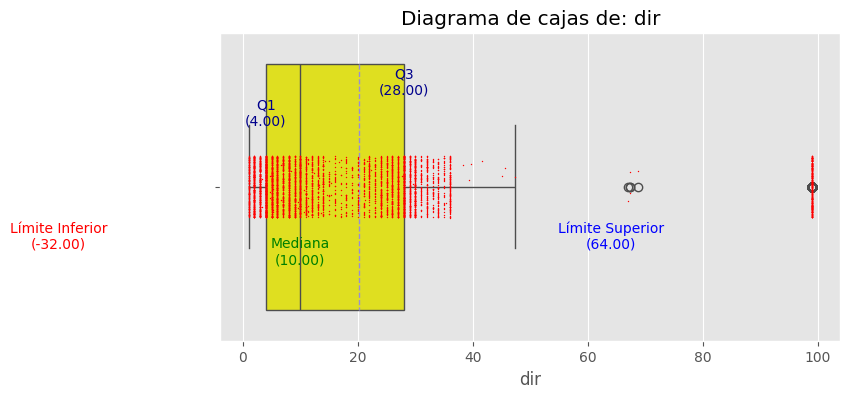

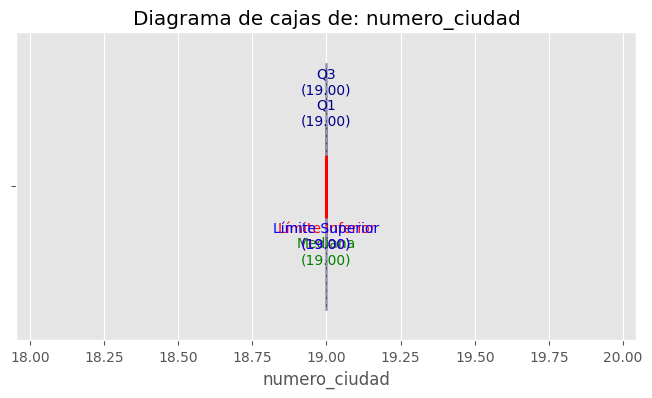

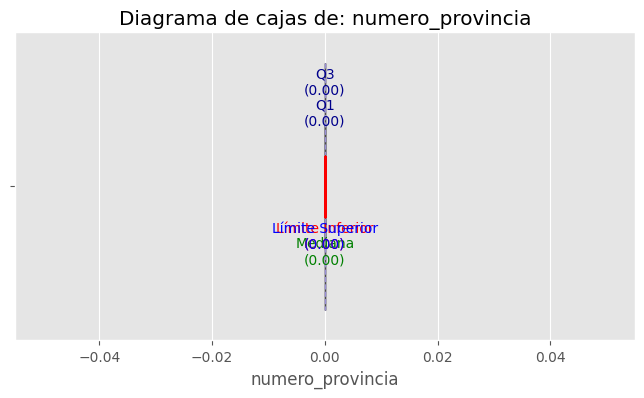

In [ ]:
# elimino de la lista de variables numéricas enteras las que no son importantes respecto a outliars: year, week, city.
new_lista_variables = lista_variables[2:-1]
for variable in new_lista_variables:
  calculolimites(f'{variable}', dataset_asturias_piloña)
  print('')

#### Grafica Precipitaciones

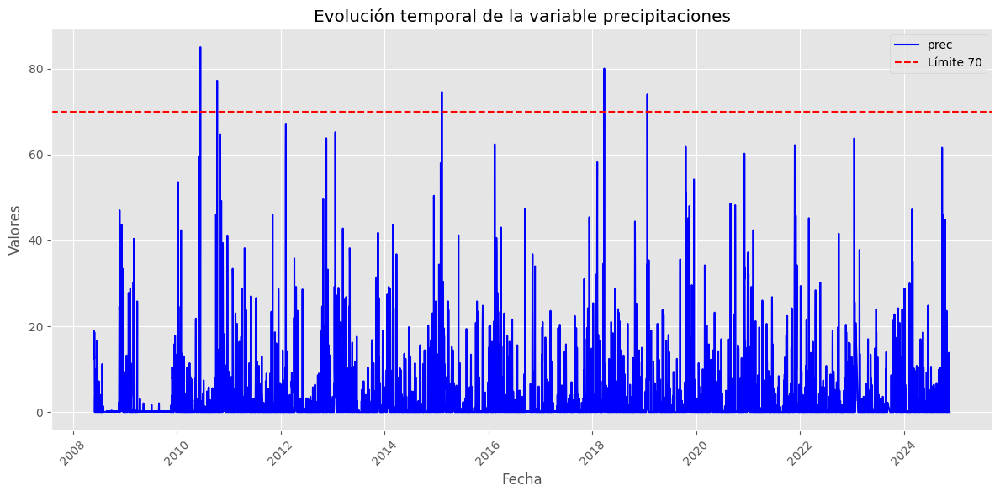

In [ ]:
try:
    dataset_asturias_piloña = dataset_asturias_piloña.drop(columns=['index'])
except KeyError as kerr:
    pass
dataset_asturias_piloña = dataset_asturias_piloña.drop_duplicates().reset_index(drop=True)
grafico_individual_ggplot(dataset_asturias_piloña, 'prec', limite_inferior=70)

In [ ]:
subdataset = dataset_asturias_piloña[dataset_asturias_piloña['prec'] > limite_inferior]
display(subdataset.head(20))

,indicativo,provincia,tmax,horaracha,hrMedia,altitud,prec,horatmin,racha,tmed,horatmax,nombre,fecha,tmin,velmedia,dir,numero_ciudad,numero_provincia,numero_indicativo
0,1199X,ASTURIAS,18.2,12.833333,89.0,280.0,19.0,4.500000,6.4,14.4,11.200000,"PILOÑA, BARGAÉU",2008-05-28,10.6,0.8,26.0,19,0,4
1,1199X,ASTURIAS,20.7,13.833333,77.0,280.0,14.0,2.500000,7.8,15.8,14.333333,"PILOÑA, BARGAÉU",2008-05-29,10.8,1.7,12.0,19,0,4
2,1199X,ASTURIAS,17.4,12.000000,88.0,280.0,12.4,9.938889,6.1,14.8,11.116667,"PILOÑA, BARGAÉU",2008-05-30,12.3,0.6,7.0,19,0,4
3,1199X,ASTURIAS,15.3,13.833333,93.0,280.0,18.6,5.500000,5.0,13.6,12.816667,"PILOÑA, BARGAÉU",2008-05-31,12.0,0.8,6.0,19,0,4
4,1199X,ASTURIAS,15.7,10.000000,91.0,280.0,6.8,17.561111,5.3,13.8,12.022222,"PILOÑA, BARGAÉU",2008-06-01,11.8,1.1,28.0,19,0,4
7,1199X,ASTURIAS,18.2,12.916667,88.0,280.0,3.6,5.066667,5.3,13.6,11.100000,"PILOÑA, BARGAÉU",2008-06-04,8.9,0.8,99.0,19,0,4
8,1199X,ASTURIAS,15.8,14.500000,94.0,280.0,3.2,17.633333,4.2,13.8,14.233333,"PILOÑA, BARGAÉU",2008-06-05,11.8,0.3,32.0,19,0,4
12,1199X,ASTURIAS,16.4,13.750000,85.0,280.0,3.6,5.266667,3.9,13.4,13.500000,"PILOÑA, BARGAÉU",2008-06-09,10.3,1.1,26.0,19,0,4
13,1199X,ASTURIAS,18.6,16.916667,89.0,280.0,10.0,2.500000,4.2,16.0,13.105556,"PILOÑA, BARGAÉU",2008-06-10,13.4,0.8,99.0,19,0,4
18,1199X,ASTURIAS,22.5,14.166667,75.0,280.0,8.2,17.116667,5.6,17.6,14.250000,"PILOÑA, BARGAÉU",2008-06-15,12.6,0.8,32.0,19,0,4


#### Histograma

In [ ]:
lista_numericas = dataset_asturias_piloña.select_dtypes(include=[np.number]).columns.to_list()

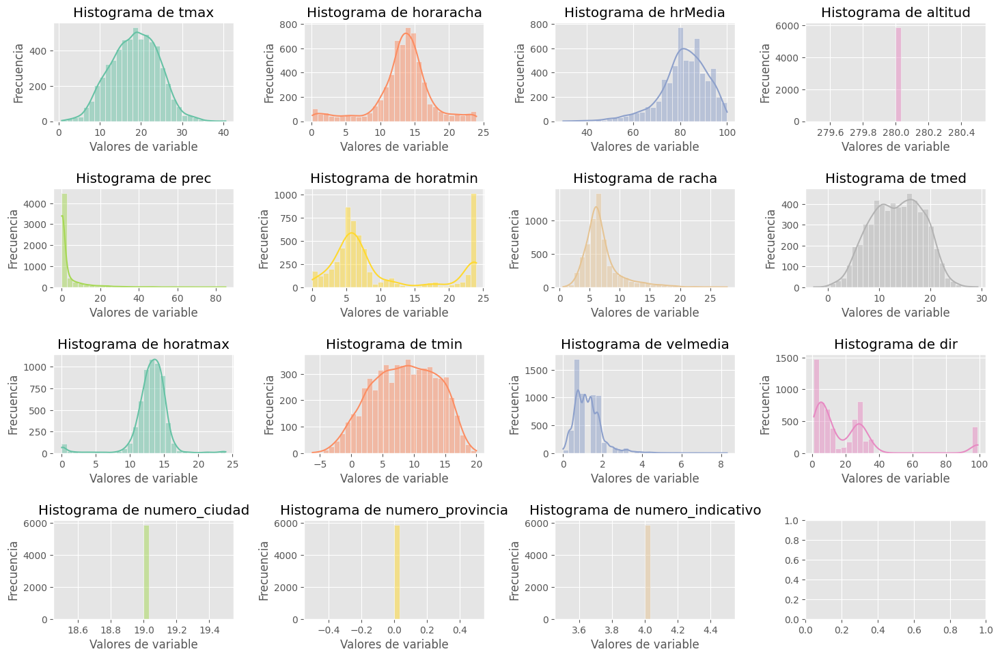

In [ ]:
histogramas(dataset_asturias_piloña[lista_numericas])

#### Diagrama de dispersión

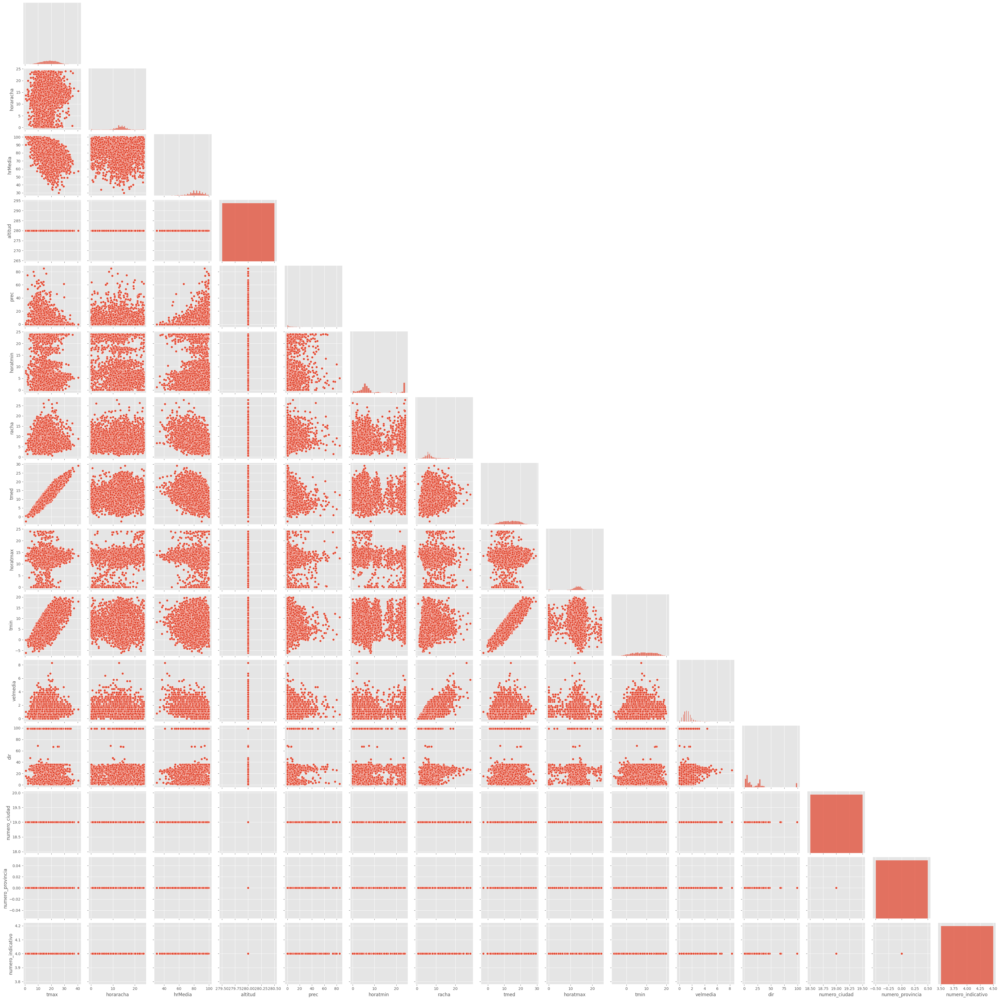

In [ ]:
# diagrama de dispersión
sns.pairplot(dataset_asturias_piloña[lista_numericas], corner=True)
plt.show()

#### Correlaciones

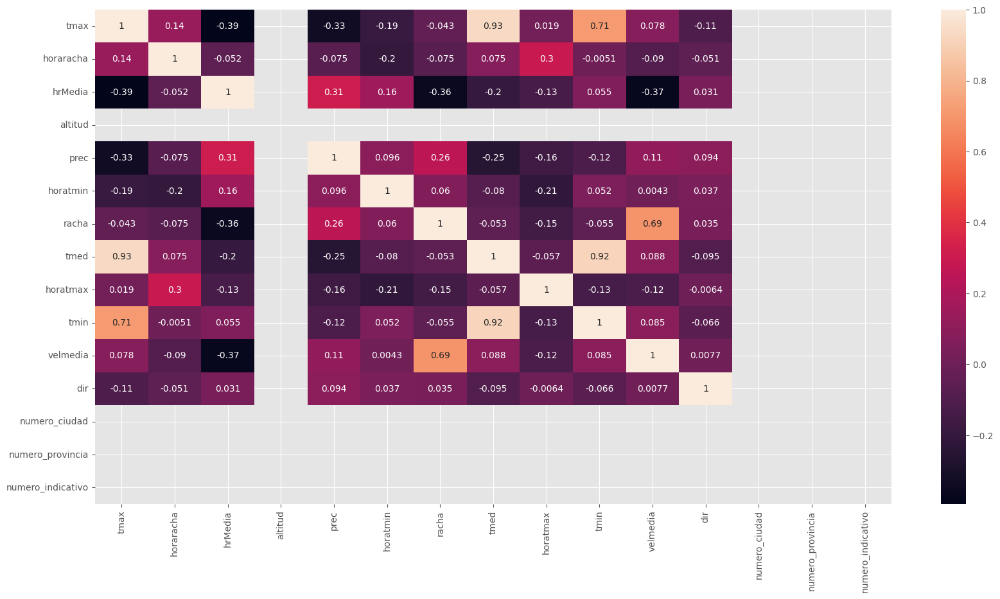

In [ ]:
correlacion(dataset_asturias_piloña[lista_numericas])

#### Guardo antes de Normalización

In [ ]:
datasetcsv_piloña = "/home/miguel/Documentos/MASTER_BIG_DATA/14_TFM/csv/dataset_asturias_piloña.csv"
dataset_asturias_piloña.to_csv(datasetcsv_piloña, index=False, encoding="utf-8")

### AMIEVA, PANIZALES

#### Genero Dataframe

In [ ]:
ciudades_filtradas = ['AMIEVA, PANIZALES']
dataset_asturias_amieva = dataset_asturias[dataset_asturias['nombre'].isin(ciudades_filtradas)]
dataset_asturias_amieva.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6523 entries, 84471 to 236204
Data columns (total 20 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   index              6523 non-null   int64         
 1   indicativo         6523 non-null   object        
 2   provincia          6523 non-null   object        
 3   tmax               6501 non-null   float64       
 4   horaracha          6123 non-null   float64       
 5   hrMedia            6511 non-null   float64       
 6   altitud            6523 non-null   int64         
 7   prec               6420 non-null   float64       
 8   horatmin           5728 non-null   float64       
 9   racha              6418 non-null   float64       
 10  tmed               6501 non-null   float64       
 11  horatmax           6363 non-null   float64       
 12  nombre             6523 non-null   object        
 13  fecha              6523 non-null   datetime64[ns]
 14  tmin   

In [ ]:
# Asegurar que la columna 'fecha' de ambos DataFrames esté en formato datetime
dataset_asturias_amieva["fecha"] = pd.to_datetime(dataset_asturias_amieva["fecha"], format="%Y-%m-%d", errors="coerce")
dataset_hidro["fecha"] = pd.to_datetime(dataset_hidro["fecha"], format="%Y-%m-%d", errors="coerce")
# como se procederá a convertir los valores nan, antes se pasan los valores negativos a nan.
# Convertir valores negativos en NaN
dataset_hidro["altura_m"] = dataset_hidro["altura_m"].apply(lambda x: np.nan if x < 0 else x)
dataset_hidro["caudal_m3s"] = dataset_hidro["caudal_m3s"].apply(lambda x: np.nan if x < 0 else x)
# Unir los DataFrames por la columna "ID"
df_merged = pd.merge(dataset_asturias_amieva, dataset_hidro, on="fecha", how="inner")
display(df_merged.head(10))

<ipython-input-94-456e71fc8f00>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset_asturias_amieva["fecha"] = pd.to_datetime(dataset_asturias_amieva["fecha"], format="%Y-%m-%d", errors="coerce")


,index,indicativo,provincia,tmax,horaracha,hrMedia,altitud,prec,horatmin,racha,...,fecha,tmin,velmedia,dir,numero_ciudad,numero_provincia,numero_indicativo,estacion,altura_m,caudal_m3s
0,92293,1186P,ASTURIAS,17.2,13.000000,86.0,370,8.0,4.500000,5.8,...,2008-05-28,10.2,0.8,26.0,1,0,3,1295,1.10,21.995
1,92307,1186P,ASTURIAS,20.9,6.500000,70.0,370,8.2,0.000000,12.2,...,2008-05-29,10.3,2.5,10.0,1,0,3,1295,1.10,21.995
2,92321,1186P,ASTURIAS,17.9,12.000000,85.0,370,7.8,NaN,6.9,...,2008-05-30,11.7,0.8,28.0,1,0,3,1295,1.10,21.995
3,92336,1186P,ASTURIAS,13.8,10.833333,96.0,370,18.8,NaN,6.1,...,2008-05-31,11.4,1.1,24.0,1,0,3,1295,1.16,25.045
4,92351,1186P,ASTURIAS,14.1,2.666667,94.0,370,3.6,5.550000,3.1,...,2008-06-01,11.0,0.3,17.0,1,0,3,1295,1.63,57.094
5,92366,1186P,ASTURIAS,19.2,13.166667,77.0,370,0.0,4.500000,5.8,...,2008-06-02,10.6,0.8,25.0,1,0,3,1295,1.34,35.614
6,92381,1186P,ASTURIAS,19.1,NaN,74.0,370,0.0,23.333333,NaN,...,2008-06-03,9.7,0.8,NaN,1,0,3,1295,1.16,25.045
7,92396,1186P,ASTURIAS,19.6,NaN,85.0,370,2.0,4.466667,6.1,...,2008-06-04,8.6,0.3,99.0,1,0,3,1295,1.00,17.423
8,92411,1186P,ASTURIAS,15.3,NaN,96.0,370,2.0,3.500000,2.8,...,2008-06-05,11.6,0.8,99.0,1,0,3,1295,0.98,16.583
9,92425,1186P,ASTURIAS,15.7,13.333333,84.0,370,0.2,NaN,6.4,...,2008-06-06,8.2,1.4,26.0,1,0,3,1295,0.98,16.583


In [ ]:
dataset_asturias_amieva = df_merged.copy()
display(dataset_asturias_amieva.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5414 entries, 0 to 5413
Data columns (total 23 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   index              5414 non-null   int64         
 1   indicativo         5414 non-null   object        
 2   provincia          5414 non-null   object        
 3   tmax               5400 non-null   float64       
 4   horaracha          5050 non-null   float64       
 5   hrMedia            5408 non-null   float64       
 6   altitud            5414 non-null   int64         
 7   prec               5325 non-null   float64       
 8   horatmin           4729 non-null   float64       
 9   racha              5317 non-null   float64       
 10  tmed               5400 non-null   float64       
 11  horatmax           5274 non-null   float64       
 12  nombre             5414 non-null   object        
 13  fecha              5414 non-null   datetime64[ns]
 14  tmin    

None

In [ ]:
# Se borran variables innecesarias
dataset_asturias_amieva = dataset_asturias_amieva.drop(columns=['numero_ciudad', 'numero_provincia', 'numero_indicativo', 'estacion'])

#### Estudio nan

<class 'pandas.core.series.Series'>


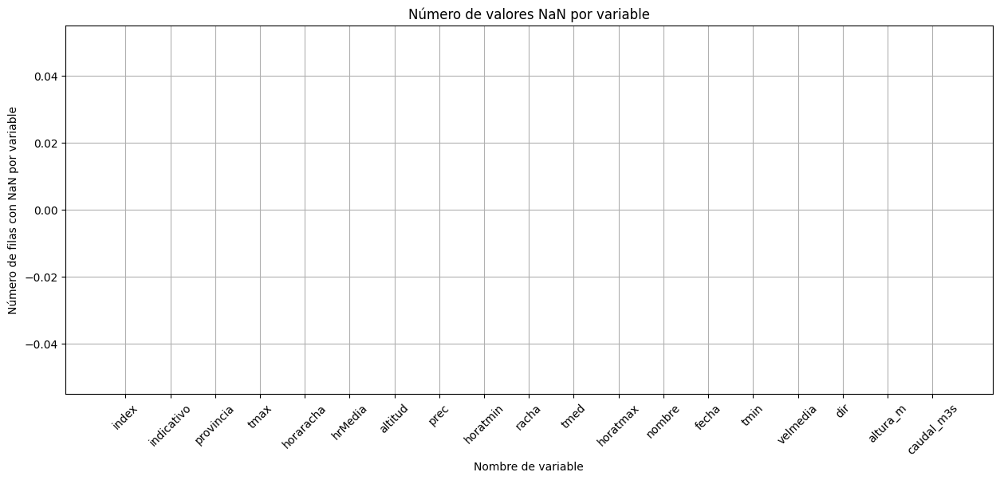

In [ ]:
imprimir_nan(dataset_asturias_amieva)

In [ ]:
display(dataset_asturias_amieva.describe())

,index,tmax,horaracha,hrMedia,altitud,prec,horatmin,racha,tmed,horatmax,fecha,tmin,velmedia,dir,altura_m,caudal_m3s
count,5414.000000,5400.000000,5050.000000,5408.000000,5414.0,5325.000000,4729.000000,5317.000000,5400.000000,5274.000000,5414,5400.000000,5338.000000,5317.000000,5296.000000,4901.000000
mean,150758.952715,18.691648,12.756432,77.823040,370.0,3.315192,10.168894,8.272597,13.752426,13.105549,2015-03-01 22:38:20.701883904,8.813222,1.517104,26.594884,1.693977,20.106781
min,92293.000000,0.900000,0.000000,18.000000,370.0,0.000000,0.000000,1.400000,-1.000000,0.000000,2008-05-28 00:00:00,-5.500000,0.000000,1.000000,0.260000,1.045000
25%,117822.750000,14.300000,11.333333,71.000000,370.0,0.000000,4.483333,5.800000,9.800000,12.433333,2012-03-15 06:00:00,5.200000,0.800000,17.000000,1.480000,5.757000
50%,149274.500000,18.800000,13.333333,80.000000,370.0,0.200000,5.983333,6.900000,14.000000,13.566667,2015-04-21 12:00:00,9.000000,1.100000,24.000000,1.690000,11.892000
75%,182682.750000,23.200000,14.833333,87.000000,370.0,2.400000,21.866667,9.400000,17.700000,14.466667,2017-12-24 18:00:00,12.600000,1.700000,28.000000,2.020000,24.216000
max,216589.000000,38.000000,62.000000,100.000000,370.0,99.400000,24.000000,30.300000,26.900000,23.983333,2021-09-30 00:00:00,21.400000,10.800000,99.000000,6.080000,495.001000
std,36798.004468,6.193189,5.116426,13.697623,0.0,7.831359,8.667130,4.280766,5.083276,3.151397,NaN,4.647869,1.293835,19.537771,0.594535,26.561584


In [ ]:
# Imputación usando KNN
imputer = KNNImputer(n_neighbors=3)
dataset_asturias_amieva[[
    'tmax', 'horaracha', 'hrMedia', 'altitud', 'racha',
    'tmed', 'horatmax', 'tmin', 'velmedia', 'dir', 'altura_m']] = imputer.fit_transform(dataset_asturias_amieva[[
    'tmax', 'horaracha', 'hrMedia', 'altitud', 'racha',
    'tmed', 'horatmax', 'tmin', 'velmedia', 'dir', 'altura_m']])

In [ ]:
dataset_asturias_amieva[['caudal_m3s', 'prec', 'horatmin']] = dataset_asturias_amieva[['caudal_m3s', 'prec', 'horatmin']].interpolate(method='linear')

#### Outliers

In [ ]:
#muestro columnas con datos numericos
lista_variables = dataset_asturias_amieva.select_dtypes(include=np.number).columns
lista_variables.tolist()

['index',
 'tmax',
 'horaracha',
 'hrMedia',
 'altitud',
 'prec',
 'horatmin',
 'racha',
 'tmed',
 'horatmax',
 'tmin',
 'velmedia',
 'dir',
 'altura_m',
 'caudal_m3s']

In [ ]:
outliers = detectar_outliers_RI(dataset_asturias_amieva)
#display(outliers)

index
limite inferior: 20532.75
limite superior: 279972.75
número de outliers: 0 

tmax
limite inferior: 0.9500000000000028
limite superior: 36.55
número de outliers: 4 

horaracha
limite inferior: 6.083333333333334
limite superior: 20.083333333333336
número de outliers: 1056 

hrMedia
limite inferior: 47.0
limite superior: 111.0
número de outliers: 161 

altitud
limite inferior: 370.0
limite superior: 370.0
número de outliers: 0 

prec
limite inferior: -3.5999999999999996
limite superior: 6.0
número de outliers: 849 

horatmin
limite inferior: -21.591666666666665
limite superior: 47.94166666666666
número de outliers: 0 

racha
limite inferior: 0.39999999999999947
limite superior: 14.8
número de outliers: 502 

tmed
limite inferior: -1.9000000000000004
limite superior: 29.300000000000004
número de outliers: 0 

horatmax
limite inferior: 9.366666666666667
limite superior: 17.5
número de outliers: 399 

tmin
limite inferior: -5.8999999999999995
limite superior: 23.7
número de outliers: 0

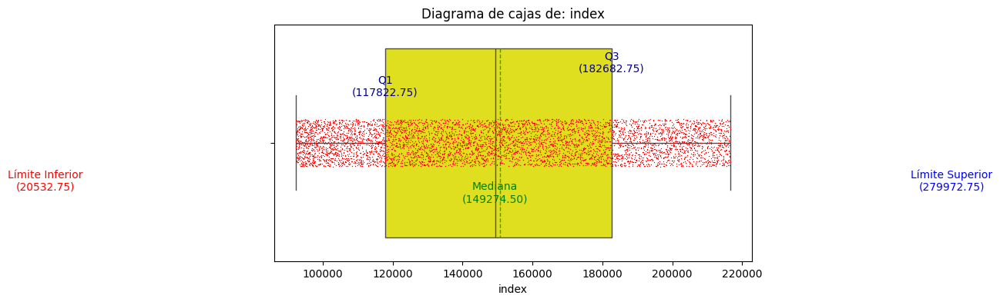

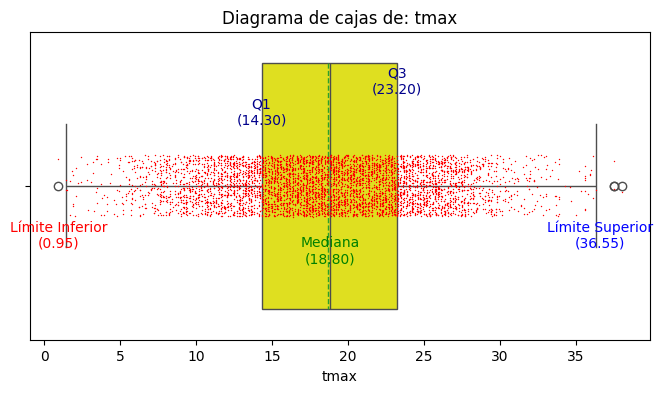

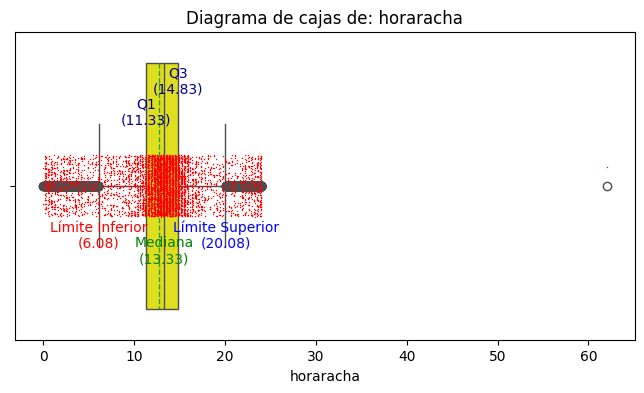

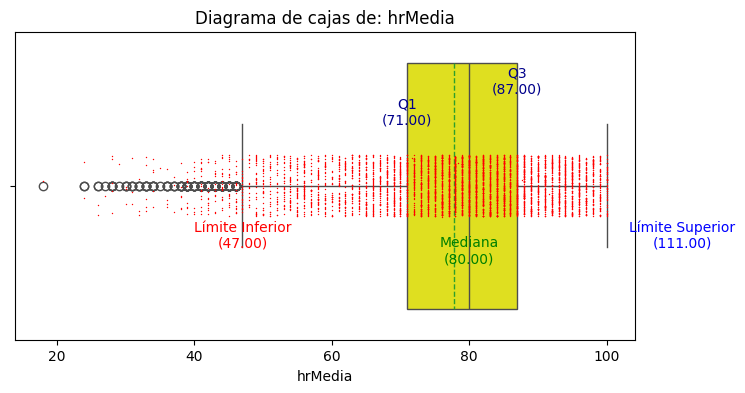

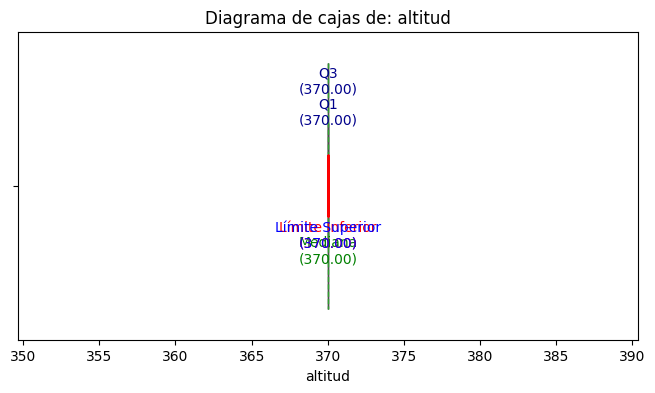

...

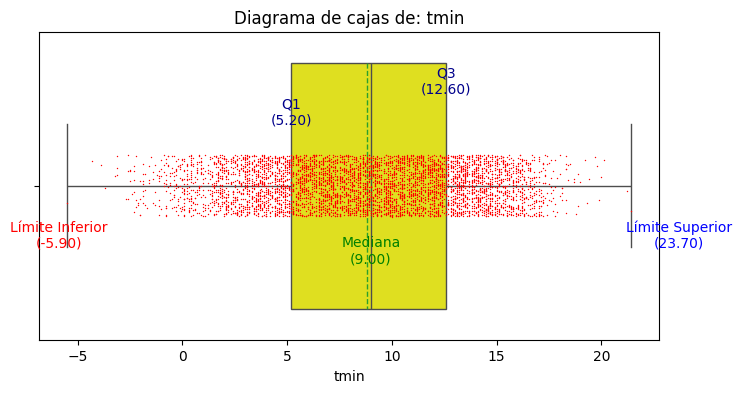

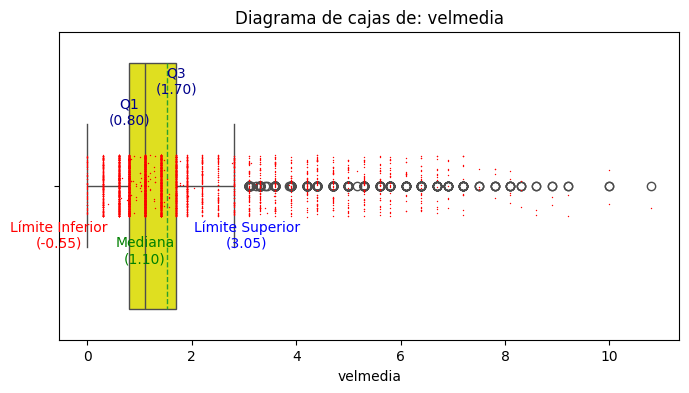

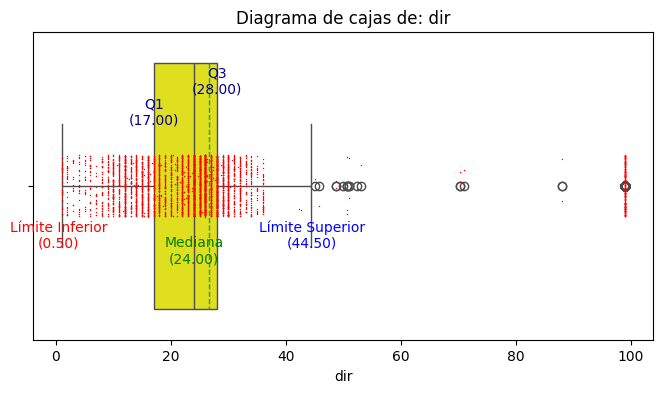

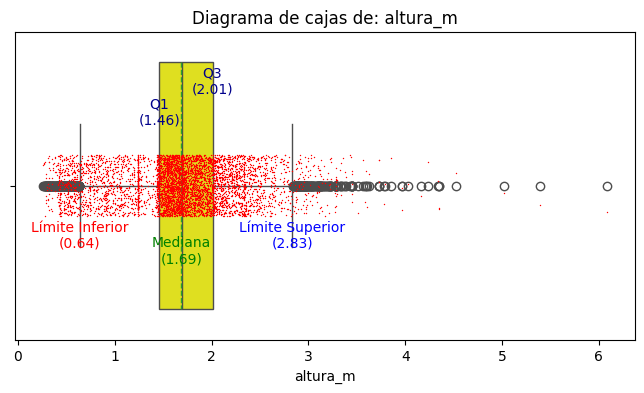

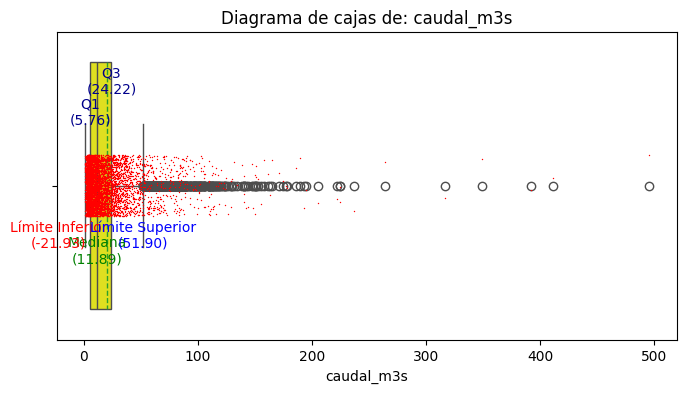

In [ ]:
# elimino de la lista de variables numéricas enteras las que no son importantes respecto a outliars: year, week, city.
new_lista_variables = lista_variables[:]
for variable in new_lista_variables:
  calculolimites(f'{variable}', dataset_asturias_amieva)
  print('')

#### Grafica Precipitaciones

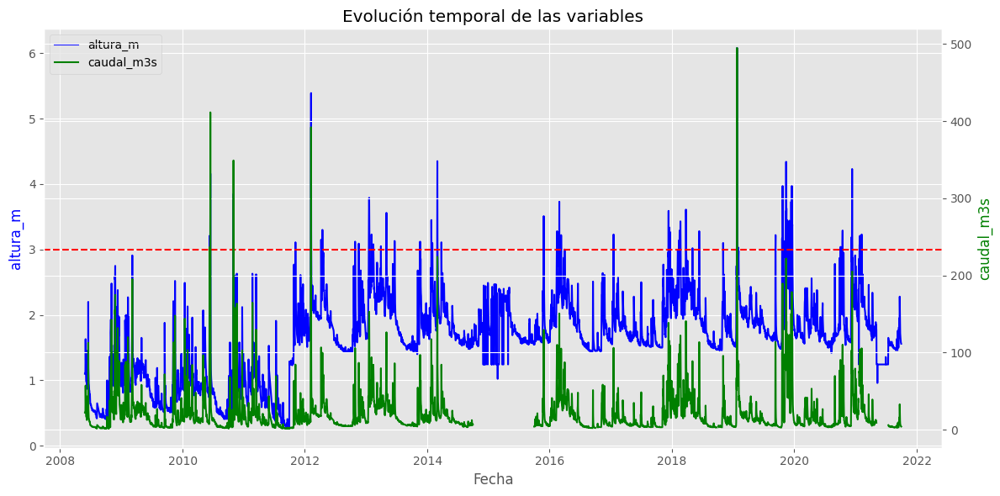

In [ ]:
try:
    dataset_asturias_amieva = dataset_asturias_amieva.drop(columns=['index'])
except KeyError as kerr:
    pass
dataset_asturias_amieva = dataset_asturias_amieva.drop_duplicates().reset_index(drop=True)
grafico_comparacion_ggplot(dataset_asturias_amieva, 'altura_m','caudal_m3s', limite_inferior=3)

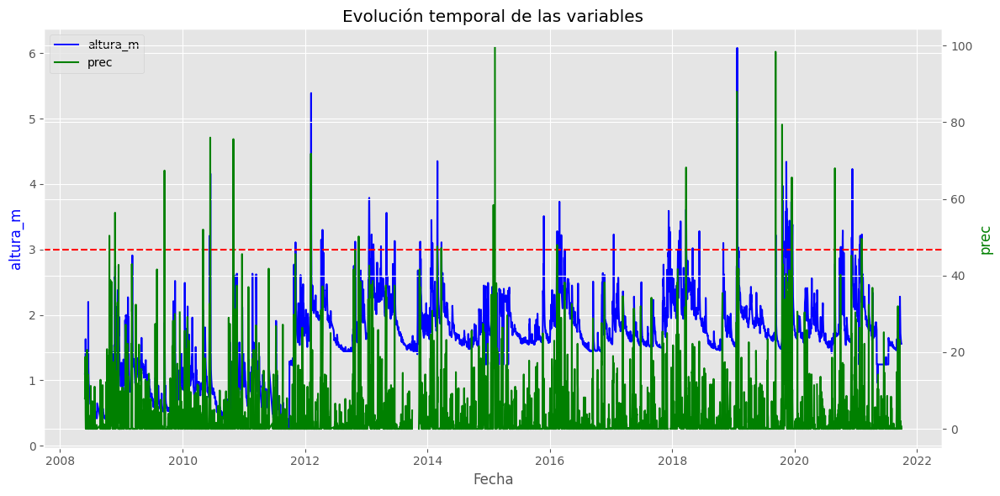

In [ ]:
try:
    dataset_asturias_amieva = dataset_asturias_amieva.drop(columns=['index'])
except KeyError as kerr:
    pass
dataset_asturias_amieva = dataset_asturias_amieva.drop_duplicates().reset_index(drop=True)
grafico_comparacion_ggplot(dataset_asturias_amieva, 'altura_m','prec', limite_inferior=3)

In [ ]:
subdataset = dataset_asturias_amieva[dataset_asturias_amieva['caudal_m3s'] > limite_inferior]
display(subdataset.head(20))

NameError: name 'limite_inferior' is not defined

In [ ]:
print(dataset_asturias_amieva.info())

#### Histograma

In [ ]:
lista_numericas = dataset_asturias_amieva.select_dtypes(include=[np.number]).columns.to_list()

In [ ]:
print(lista_numericas)

['tmax', 'horaracha', 'hrMedia', 'altitud', 'prec', 'horatmin', 'racha', 'tmed', 'horatmax', 'tmin', 'velmedia', 'dir', 'altura_m', 'caudal_m3s']


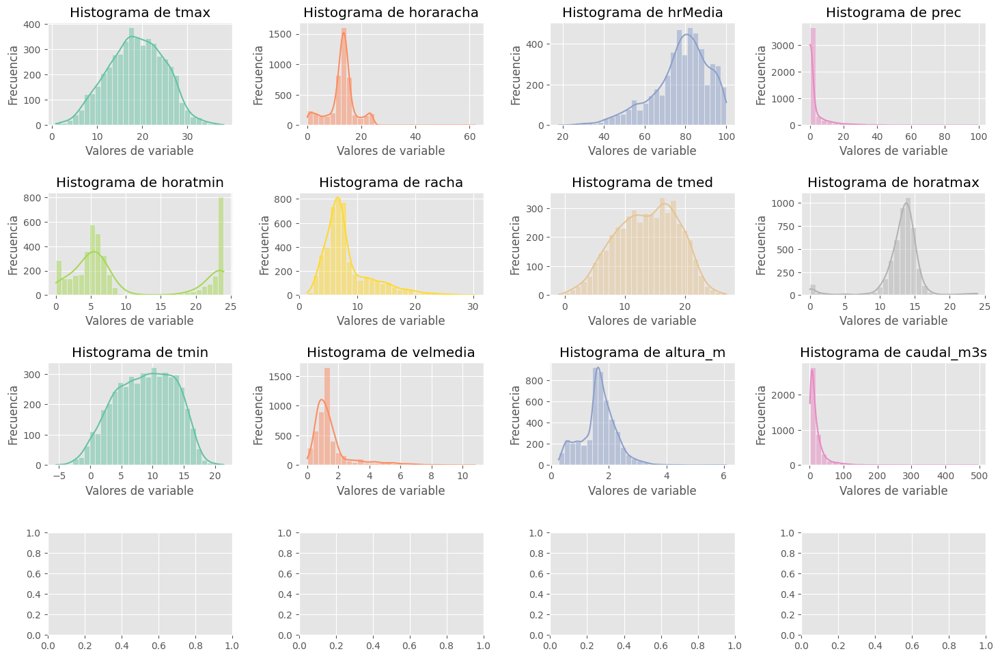

In [ ]:
histogramas(dataset_asturias_amieva[['tmax', 'horaracha', 'hrMedia', 'prec', 'horatmin', 'racha', 'tmed', 'horatmax', 'tmin', 'velmedia', 'altura_m', 'caudal_m3s']])

#### Diagrama de dispersión

In [ ]:
# diagrama de dispersión
sns.pairplot(dataset_asturias_amieva[lista_numericas], corner=True)
plt.show()

Output hidden; open in https://colab.research.google.com to view.

#### Correlaciones

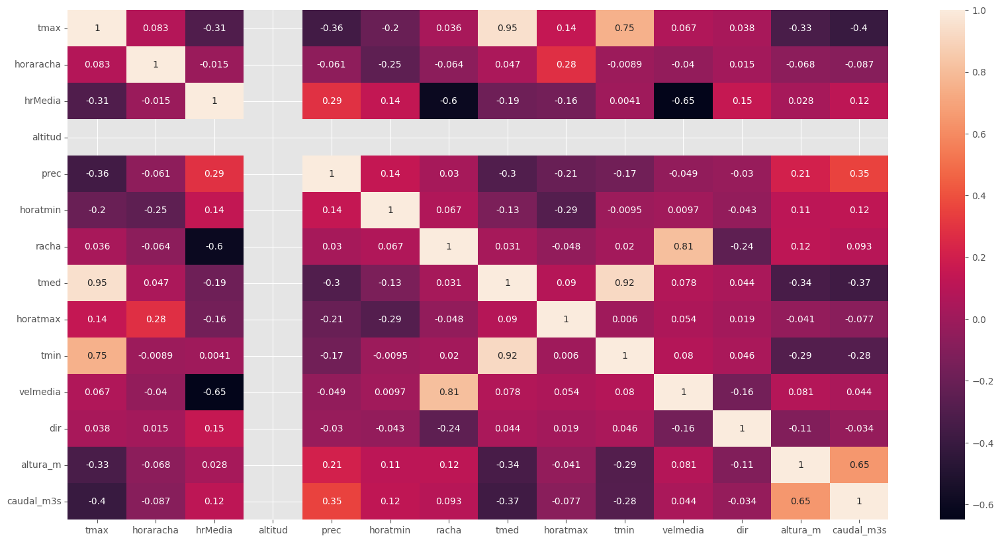

In [ ]:
correlacion(dataset_asturias_amieva[lista_numericas])

#### Discretización valores altura

In [ ]:
maximo = dataset_asturias_amieva['altura_m'].max()
maximo

6.08

In [ ]:
# Definir los intervalos que se asignarán a cada valor discreto entre 1 y 10
bins = np.linspace(dataset_asturias_amieva['altura_m'].min(), dataset_asturias_amieva['altura_m'].max(), 65)  # 10 intervalos
# Etiquetas discretas (1 a 10)
etiquetas = np.arange(1, 65)

# Discretizar los valores de la columna 'altura_m'
dataset_asturias_amieva['altura_m_discreta'] = pd.cut(dataset_asturias_amieva['altura_m'], bins=bins, labels=etiquetas, include_lowest=True)
display(dataset_asturias_amieva.sample(3))

,index,indicativo,provincia,tmax,horaracha,hrMedia,altitud,prec,horatmin,racha,...,tmin,velmedia,dir,numero_ciudad,numero_provincia,numero_indicativo,estacion,altura_m,caudal_m3s,altura_m_discreta
5131,209290,1186P,ASTURIAS,20.1,9.333333,55.0,370,0.0,6.050000,15.3,...,16.7,5.8,10.0,1,0,3,1295,2.31,34.149,23
4259,187638,1186P,ASTURIAS,24.2,12.333333,83.0,370,0.0,3.833333,6.1,...,15.0,1.4,26.0,1,0,3,1295,1.89,12.850,18
3614,171677,1186P,ASTURIAS,16.9,12.000000,94.0,370,0.2,6.616667,4.4,...,13.4,0.8,28.0,1,0,3,1295,1.45,NaN,14


In [ ]:
display(dataset_asturias_amieva.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5414 entries, 0 to 5413
Data columns (total 19 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   index       5414 non-null   int64         
 1   indicativo  5414 non-null   object        
 2   provincia   5414 non-null   object        
 3   tmax        5414 non-null   float64       
 4   horaracha   5414 non-null   float64       
 5   hrMedia     5414 non-null   float64       
 6   altitud     5414 non-null   float64       
 7   prec        5414 non-null   float64       
 8   horatmin    5414 non-null   float64       
 9   racha       5414 non-null   float64       
 10  tmed        5414 non-null   float64       
 11  horatmax    5414 non-null   float64       
 12  nombre      5414 non-null   object        
 13  fecha       5414 non-null   datetime64[ns]
 14  tmin        5414 non-null   float64       
 15  velmedia    5414 non-null   float64       
 16  dir         5414 non-nul

None

#### Guardo antes de Normalización

In [ ]:
datasetcsv_amieva = "./drive/MyDrive/MASTER_BIG_DATA/14_TFM/scripts/csv/dataset_asturias_amieva.csv"
dataset_asturias_amieva.to_csv(datasetcsv_amieva, index=False, encoding="utf-8")

### COLUNGA

#### Estudio nan

<class 'pandas.core.frame.DataFrame'>
Index: 8982 entries, 48404 to 236210
Data columns (total 20 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   index              8982 non-null   int64         
 1   indicativo         8982 non-null   object        
 2   provincia          8982 non-null   object        
 3   tmax               6799 non-null   float64       
 4   horaracha          5769 non-null   float64       
 5   hrMedia            6190 non-null   float64       
 6   altitud            8982 non-null   int64         
 7   prec               8679 non-null   float64       
 8   horatmin           6126 non-null   float64       
 9   racha              6166 non-null   float64       
 10  tmed               6799 non-null   float64       
 11  horatmax           6579 non-null   float64       
 12  nombre             8982 non-null   object        
 13  fecha              8982 non-null   datetime64[ns]
 14  tmin   

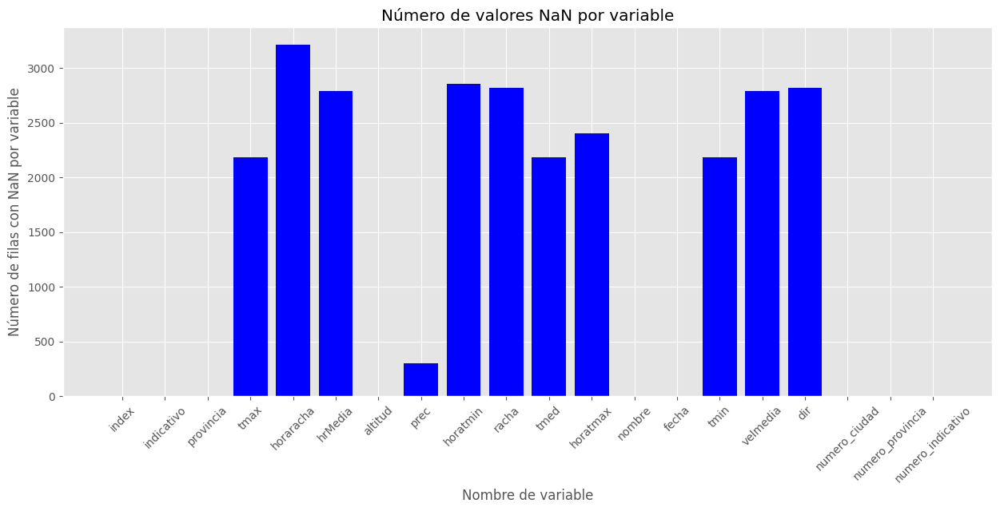

In [ ]:
ciudades_filtradas = ['COLUNGA']
dataset_asturias_colunga = dataset_asturias[dataset_asturias['nombre'].isin(ciudades_filtradas)]
dataset_asturias_colunga.info()
imprimir_nan(dataset_asturias_colunga)

In [ ]:
display(dataset_asturias_colunga.describe())

,index,tmax,horaracha,hrMedia,altitud,prec,horatmin,racha,tmed,horatmax,fecha,tmin,velmedia,dir,numero_ciudad,numero_provincia,numero_indicativo
count,8982.000000,6799.000000,5769.000000,6190.000000,8982.0,8679.000000,6126.000000,6166.000000,6799.000000,6579.000000,8982,6799.000000,6192.00000,6166.000000,8982.0,8982.0,8982.0
mean,139784.625362,17.819679,12.342714,84.274313,30.0,3.057184,9.681388,7.853081,14.200279,12.848794,2013-04-01 23:58:43.046092288,10.580585,2.23582,23.439831,7.0,0.0,5.0
min,56226.000000,3.300000,0.166667,39.000000,30.0,0.000000,0.000000,2.800000,2.000000,0.000000,2001-08-01 00:00:00,-1.500000,0.00000,1.000000,7.0,0.0,5.0
25%,90899.500000,14.600000,8.833333,80.000000,30.0,0.000000,3.666667,5.300000,11.000000,11.733333,2007-10-28 06:00:00,7.200000,1.70000,8.000000,7.0,0.0,5.0
50%,132983.000000,17.900000,12.666667,86.000000,30.0,0.000000,5.616667,6.900000,14.000000,13.216667,2014-01-18 00:00:00,10.400000,1.90000,24.000000,7.0,0.0,5.0
75%,188367.750000,21.300000,16.333333,90.000000,30.0,2.500000,21.516667,9.400000,17.700000,14.416667,2018-08-10 18:00:00,14.300000,2.80000,27.000000,7.0,0.0,5.0
max,244032.000000,34.600000,23.983333,100.000000,30.0,76.600000,24.000000,25.600000,26.100000,24.000000,2024-11-17 00:00:00,20.900000,9.20000,99.000000,7.0,0.0,5.0
std,55786.950356,4.233747,6.070946,8.588774,0.0,7.019178,8.672147,3.271978,4.094451,3.116660,NaN,4.380800,1.03323,23.113385,0.0,0.0,0.0


In [ ]:
#dataset_asturias_colunga = dataset_asturias_colunga.drop(columns=['sol', 'presMin', 'horaPresMin', 'presMax', 'horaPresMax'])

In [ ]:
# Imputación usando KNN
imputer = KNNImputer(n_neighbors=3)
dataset_asturias_colunga[[
    'tmax', 'horaracha', 'hrMedia', 'altitud', 'prec', 'horatmin', 'racha',
    'tmed', 'horatmax', 'tmin', 'velmedia', 'dir']] = imputer.fit_transform(dataset_asturias_colunga[[
    'tmax', 'horaracha', 'hrMedia', 'altitud', 'prec', 'horatmin', 'racha',
    'tmed', 'horatmax', 'tmin', 'velmedia', 'dir']])

/tmp/ipykernel_10498/3474773063.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset_asturias_colunga[[


#### Outliers

In [ ]:
#muestro columnas con datos numericos
lista_variables = dataset_asturias_colunga.select_dtypes(include=np.number).columns
lista_variables.tolist()

['index',
 'tmax',
 'horaracha',
 'hrMedia',
 'altitud',
 'prec',
 'horatmin',
 'racha',
 'tmed',
 'horatmax',
 'tmin',
 'velmedia',
 'dir',
 'numero_ciudad',
 'numero_provincia',
 'numero_indicativo']

In [ ]:
outliers = detectar_outliers_RI(dataset_asturias_colunga)
display(outliers)

index
limite inferior: -55302.875
limite superior: 334570.125
número de outliers: 0 

tmax
limite inferior: 3.950000000000001
limite superior: 34.75
número de outliers: 1 

horaracha
limite inferior: 2.25
limite superior: 24.25
número de outliers: 499 

hrMedia
limite inferior: 69.0
limite superior: 101.0
número de outliers: 345 

altitud
limite inferior: 30.0
limite superior: 30.0
número de outliers: 0 

prec
limite inferior: -3.5999999999999996
limite superior: 6.0
número de outliers: 1398 

horatmin
limite inferior: -8.541666666666664
limite superior: 21.791666666666664
número de outliers: 1519 

racha
limite inferior: -0.06666666666666732
limite superior: 13.8
número de outliers: 390 

tmed
limite inferior: 0.34999999999999964
limite superior: 31.150000000000002
número de outliers: 0 

horatmax
limite inferior: 9.002777777777776
limite superior: 17.025000000000002
número de outliers: 583 

tmin
limite inferior: -4.35
limite superior: 28.849999999999998
número de outliers: 0 

velme

{'numero_indicativo': Series([], Name: numero_indicativo, dtype: int64)}

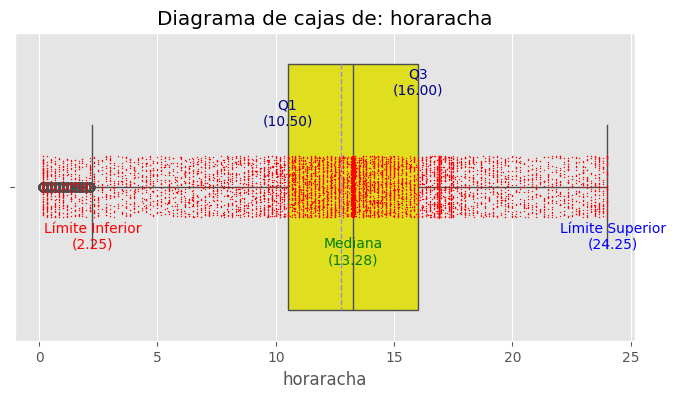

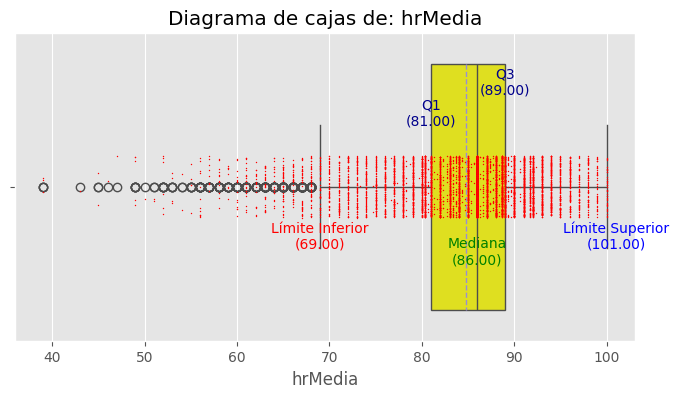

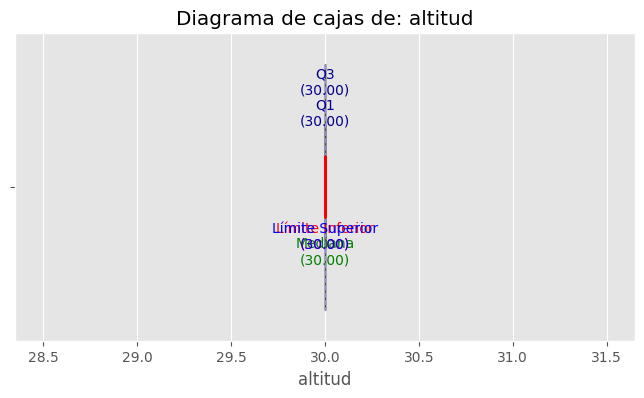

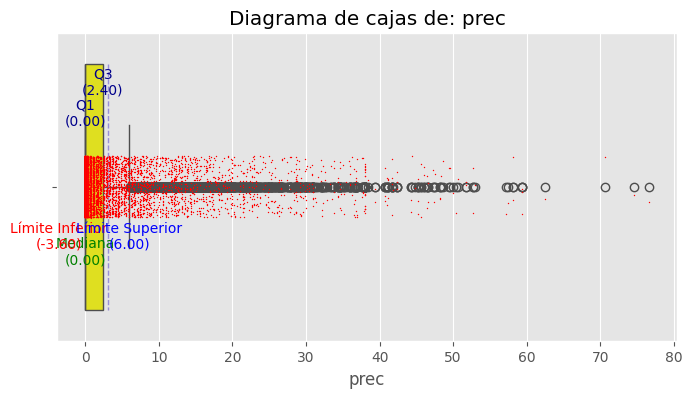

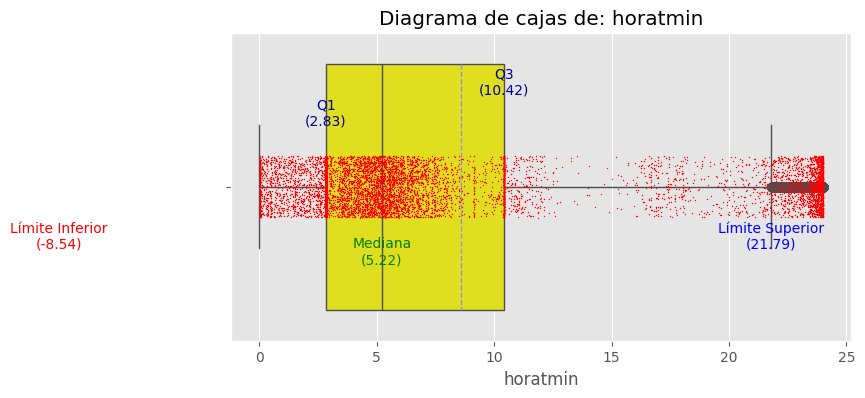

...

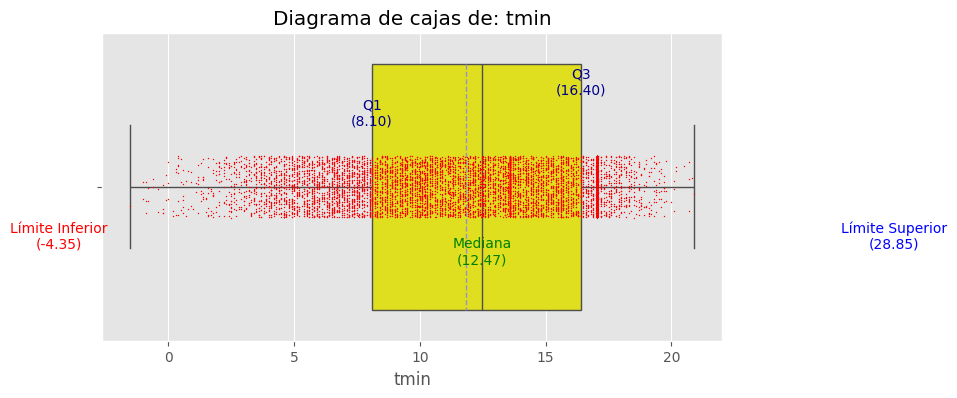

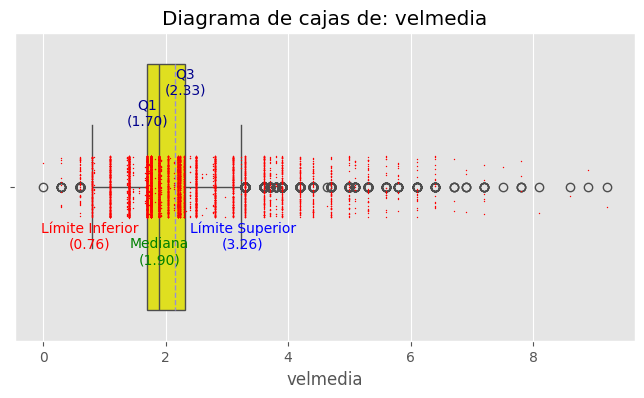

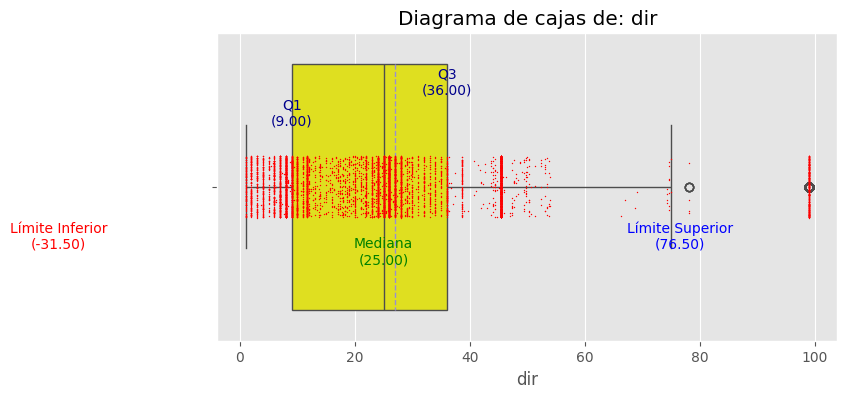

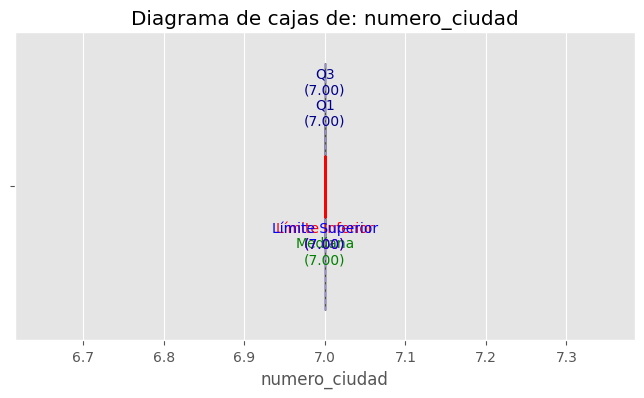

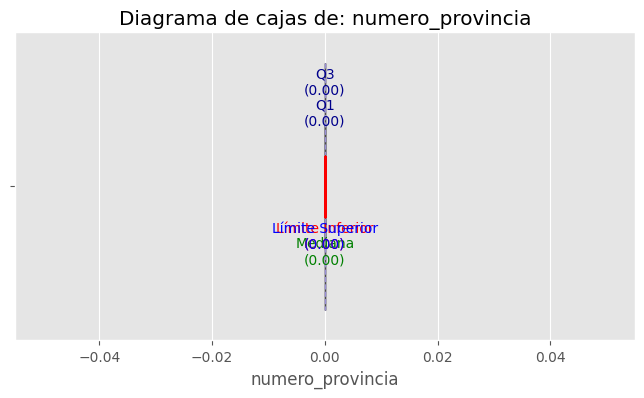

In [ ]:
# elimino de la lista de variables numéricas enteras las que no son importantes respecto a outliars: year, week, city.
new_lista_variables = lista_variables[2:-1]
for variable in new_lista_variables:
  calculolimites(f'{variable}', dataset_asturias_colunga)
  print('')

#### Grafica Precipitaciones

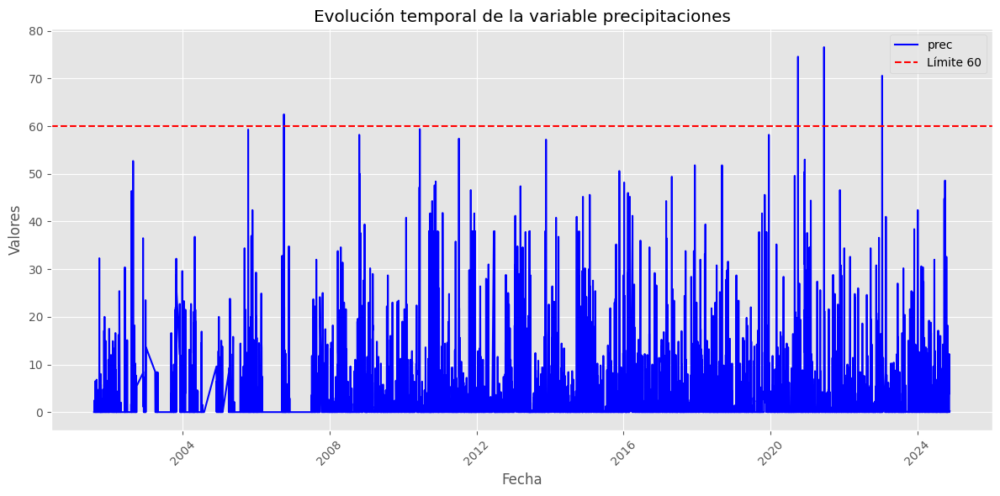

In [ ]:
try:
    dataset_asturias_colunga = dataset_asturias_colunga.drop(columns=['index'])
except KeyError as kerr:
    pass
dataset_asturias_colunga = dataset_asturias_colunga.drop_duplicates().reset_index(drop=True)
grafico_individual_ggplot(dataset_asturias_colunga, 'prec', limite_inferior=60)

In [ ]:
subdataset = dataset_asturias_colunga[dataset_asturias_colunga['prec'] > limite_inferior]
display(subdataset.head(20))

,indicativo,provincia,tmax,horaracha,hrMedia,altitud,prec,horatmin,racha,tmed,horatmax,nombre,fecha,tmin,velmedia,dir,numero_ciudad,numero_provincia,numero_indicativo
14,1203D,ASTURIAS,21.400000,16.888889,88.666667,30.0,6.5,10.416667,6.666667,17.466667,12.011111,COLUNGA,2001-08-15,13.566667,2.033333,11.666667,7,0,5
26,1203D,ASTURIAS,17.500000,16.888889,88.666667,30.0,6.8,4.266667,6.666667,14.400000,11.061111,COLUNGA,2001-08-27,11.266667,2.033333,11.666667,7,0,5
27,1203D,ASTURIAS,20.633333,10.277778,84.000000,30.0,4.8,5.672222,7.033333,17.400000,13.611111,COLUNGA,2001-08-28,14.166667,1.900000,50.333333,7,0,5
29,1203D,ASTURIAS,21.400000,16.888889,88.666667,30.0,4.5,10.416667,6.666667,17.466667,12.011111,COLUNGA,2001-08-30,13.566667,2.033333,11.666667,7,0,5
43,1203D,ASTURIAS,21.400000,16.888889,88.666667,30.0,4.7,10.416667,6.666667,17.466667,12.011111,COLUNGA,2001-09-13,13.566667,2.033333,11.666667,7,0,5
53,1203D,ASTURIAS,21.400000,16.888889,88.666667,30.0,32.3,10.416667,6.666667,17.466667,12.011111,COLUNGA,2001-09-23,13.566667,2.033333,11.666667,7,0,5
67,1203D,ASTURIAS,20.900000,14.166667,84.000000,30.0,8.0,10.416667,8.600000,16.933333,11.661111,COLUNGA,2001-10-07,13.000000,2.200000,20.000000,7,0,5
69,1203D,ASTURIAS,15.900000,10.166667,88.666667,30.0,5.8,15.288889,8.233333,13.566667,12.500000,COLUNGA,2001-10-09,11.233333,1.833333,13.000000,7,0,5
91,1203D,ASTURIAS,20.633333,10.277778,84.000000,30.0,4.8,5.672222,7.033333,17.400000,13.611111,COLUNGA,2001-10-31,14.166667,1.900000,50.333333,7,0,5
100,1203D,ASTURIAS,21.400000,16.888889,88.666667,30.0,17.1,10.416667,6.666667,17.466667,12.011111,COLUNGA,2001-11-09,13.566667,2.033333,11.666667,7,0,5


#### Guardo antes de Normalización

In [ ]:
datasetcsv_colunga = "/home/miguel/Documentos/MASTER_BIG_DATA/14_TFM/csv/dataset_asturias_colunga.csv"
dataset_asturias_colunga.to_csv(datasetcsv_colunga, index=False, encoding="utf-8")

## Cargo Asturias y genero json para Tokenizar

In [ ]:
import pandas as pd
lista = []
datacsv_ami = './drive/MyDrive/MASTER_BIG_DATA/14_TFM/scripts/csv/dataset_asturias_amieva.csv'
datacsv_pil = '/home/miguel/Documentos/MASTER_BIG_DATA/14_TFM/csv/dataset_asturias_piloña.csv'
datacsv_cab = '/home/miguel/Documentos/MASTER_BIG_DATA/14_TFM/csv/dataset_asturias_cabrales.csv'
data_ami = pd.read_csv(datacsv_ami, delimiter=",", encoding="utf-8")
# data_pil = pd.read_csv(datacsv_pil, delimiter=",", encoding="utf-8")
# data_cab = pd.read_csv(datacsv_cab, delimiter=",", encoding="utf-8")
lista = [data_ami]#, data_pil, data_cab]
data = pd.concat(lista, ignore_index=True)

In [ ]:
lista_columnas = data.columns.to_list()
lista_columnas

['indicativo',
 'provincia',
 'tmax',
 'horaracha',
 'hrMedia',
 'altitud',
 'prec',
 'horatmin',
 'racha',
 'tmed',
 'horatmax',
 'nombre',
 'fecha',
 'tmin',
 'velmedia',
 'dir',
 'altura_m',
 'caudal_m3s']

In [ ]:
# Convertir a formato deseado
result = []

for _, row in data.iterrows():
    text = f"indicativo: {row['indicativo']}, provincia: {row['provincia'].lower()}, tmax: {row['tmax']}, horaracha:{row['horaracha']}, hrMedia: {row['hrMedia']}, altitud: {row['altitud']}, horatmin: {row['horatmin']}, racha: {row['racha']}, tmed: {row['tmed']}, horatmax:{row['horatmax']}, nombre: {row['nombre']}, fecha: {row['fecha']}, tmin: {row['tmin']}, velmedia: {row['velmedia']}, dir: {row['dir']}, prec: {row['prec']}, caudal: {row['caudal_m3s']}"
    result.append({"text": text, "labels": int(row['altura_m'])})

# Mostrar el resultado
print(result[:3])

[{'text': 'indicativo: 1186P, provincia: asturias, tmax: 17.2, horaracha:13.0, hrMedia: 86.0, altitud: 370.0, horatmin: 4.5, racha: 5.8, tmed: 13.7, horatmax:12.566666666666666, nombre: AMIEVA, PANIZALES, fecha: 2008-05-28, tmin: 10.2, velmedia: 0.8, dir: 26.0, prec: 8.0, caudal: 21.995', 'labels': 1}, {'text': 'indicativo: 1186P, provincia: asturias, tmax: 20.9, horaracha:6.5, hrMedia: 70.0, altitud: 370.0, horatmin: 0.0, racha: 12.2, tmed: 15.6, horatmax:14.95, nombre: AMIEVA, PANIZALES, fecha: 2008-05-29, tmin: 10.3, velmedia: 2.5, dir: 10.0, prec: 8.2, caudal: 21.995', 'labels': 1}, {'text': 'indicativo: 1186P, provincia: asturias, tmax: 17.9, horaracha:12.0, hrMedia: 85.0, altitud: 370.0, horatmin: nan, racha: 6.9, tmed: 14.8, horatmax:12.85, nombre: AMIEVA, PANIZALES, fecha: 2008-05-30, tmin: 11.7, velmedia: 0.8, dir: 28.0, prec: 7.8, caudal: 21.995', 'labels': 1}]


In [ ]:
datasetjson_asturias = "/home/miguel/Documentos/MASTER_BIG_DATA/14_TFM/json/dataset_asturias_sella.json"

In [ ]:
import json
with open(datasetjson_asturias, "w", encoding="utf-8") as json_file:
    json.dump(result, json_file, indent=4, ensure_ascii=False)

## Genero json de las tres estaciones de forma individual

In [ ]:
# Amieva
# Convertir a formato deseado
result = []
dataset_asturias_amieva # uso directamente el dataframe
for _, row in dataset_asturias_amieva.iterrows():
    text = f"indicativo: {row['indicativo']}, provincia: {row['provincia'].lower()}, tmax: {row['tmax']}, horaracha:{row['horaracha']}, hrMedia: {row['hrMedia']}, altitud: {row['altitud']}, horatmin: {row['horatmin']}, racha: {row['racha']}, tmed: {row['tmed']}, horatmax:{row['horatmax']}, nombre: {row['nombre']}, fecha: {row['fecha']}, tmin: {row['tmin']}, velmedia: {row['velmedia']}, dir: {row['dir']}, prec: {row['prec']}, caudal: {row['caudal_m3s']}"
    result.append({"text": text, "labels": int(row['altura_m_discreta'])})

# Mostrar el resultado
print(result[:3])

datasetjson_amieva = "./drive/MyDrive/MASTER_BIG_DATA/14_TFM/json/dataset_asturias_amieva.json"

import json
with open(datasetjson_amieva, "w", encoding="utf-8") as json_file:
    json.dump(result, json_file, indent=4, ensure_ascii=False)

[{'text': 'indicativo: 1186P, provincia: asturias, tmax: 17.2, horaracha:13.0, hrMedia: 86.0, altitud: 370.0, horatmin: 4.5, racha: 5.8, tmed: 13.7, horatmax:12.566666666666666, nombre: AMIEVA, PANIZALES, fecha: 2008-05-28 00:00:00, tmin: 10.2, velmedia: 0.8, dir: 26.0, prec: 8.0, caudal: 21.995', 'labels': 10}, {'text': 'indicativo: 1186P, provincia: asturias, tmax: 20.9, horaracha:6.5, hrMedia: 70.0, altitud: 370.0, horatmin: 0.0, racha: 12.2, tmed: 15.6, horatmax:14.95, nombre: AMIEVA, PANIZALES, fecha: 2008-05-29 00:00:00, tmin: 10.3, velmedia: 2.5, dir: 10.0, prec: 8.2, caudal: 21.995', 'labels': 10}, {'text': 'indicativo: 1186P, provincia: asturias, tmax: 17.9, horaracha:12.0, hrMedia: 85.0, altitud: 370.0, horatmin: nan, racha: 6.9, tmed: 14.8, horatmax:12.85, nombre: AMIEVA, PANIZALES, fecha: 2008-05-30 00:00:00, tmin: 11.7, velmedia: 0.8, dir: 28.0, prec: 7.8, caudal: 21.995', 'labels': 10}]


In [ ]:
# Piloña
# Convertir a formato deseado
result = []

for _, row in data_pil.iterrows():
    text = f"indicativo: {row['indicativo']}, provincia: {row['provincia'].lower()}, tmax: {row['tmax']}, horaracha:{row['horaracha']}, hrMedia: {row['hrMedia']}, altitud: {row['altitud']}, horatmin: {row['horatmin']}, racha: {row['racha']}, tmed: {row['tmed']}, horatmax:{row['horatmax']}, nombre: {row['nombre']}, fecha: {row['fecha']}, tmin: {row['tmin']}, velmedia: {row['velmedia']}, dir: {row['dir']}"
    result.append({"text": text, "labels": int(row['prec'])})

# Mostrar el resultado
print(result[:3])

atasetjson_piloña = "/home/miguel/Documentos/MASTER_BIG_DATA/14_TFM/json/dataset_asturias_piloña.json"

import json
with open(atasetjson_piloña, "w", encoding="utf-8") as json_file:
    json.dump(result, json_file, indent=4, ensure_ascii=False)

[{'text': 'indicativo: 1199X, provincia: asturias, tmax: 18.2, horaracha:12.833333333333334, hrMedia: 89.0, altitud: 280.0, horatmin: 4.5, racha: 6.4, tmed: 14.4, horatmax:11.2, nombre: PILOÑA, BARGAÉU, fecha: 2008-05-28, tmin: 10.6, velmedia: 0.8, dir: 26.0', 'labels': 19}, {'text': 'indicativo: 1199X, provincia: asturias, tmax: 20.7, horaracha:13.833333333333334, hrMedia: 77.0, altitud: 280.0, horatmin: 2.5, racha: 7.8, tmed: 15.8, horatmax:14.333333333333334, nombre: PILOÑA, BARGAÉU, fecha: 2008-05-29, tmin: 10.8, velmedia: 1.7, dir: 12.0', 'labels': 14}, {'text': 'indicativo: 1199X, provincia: asturias, tmax: 17.4, horaracha:12.0, hrMedia: 88.0, altitud: 280.0, horatmin: 9.938888888888888, racha: 6.1, tmed: 14.8, horatmax:11.116666666666667, nombre: PILOÑA, BARGAÉU, fecha: 2008-05-30, tmin: 12.3, velmedia: 0.6, dir: 7.0', 'labels': 12}]


In [ ]:
# Cabrales
# Convertir a formato deseado
result = []

for _, row in data_cab.iterrows():
    text = f"indicativo: {row['indicativo']}, provincia: {row['provincia'].lower()}, tmax: {row['tmax']}, horaracha:{row['horaracha']}, hrMedia: {row['hrMedia']}, altitud: {row['altitud']}, horatmin: {row['horatmin']}, racha: {row['racha']}, tmed: {row['tmed']}, horatmax:{row['horatmax']}, nombre: {row['nombre']}, fecha: {row['fecha']}, tmin: {row['tmin']}, velmedia: {row['velmedia']}, dir: {row['dir']}"
    result.append({"text": text, "labels": int(row['prec'])})

# Mostrar el resultado
print(result[:3])

atasetjson_cabrales = "/home/miguel/Documentos/MASTER_BIG_DATA/14_TFM/json/dataset_asturias_cabrales.json"

import json
with open(atasetjson_cabrales, "w", encoding="utf-8") as json_file:
    json.dump(result, json_file, indent=4, ensure_ascii=False)

[{'text': 'indicativo: 1179B, provincia: asturias, tmax: 21.3, horaracha:8.833333333333334, hrMedia: 86.0, altitud: 458.0, horatmin: 2.75, racha: 13.633333333333333, tmed: 17.2, horatmax:11.8, nombre: CABRALES, fecha: 2009-07-23, tmin: 13.0, velmedia: 4.533333333333334, dir: 25.33333333333333', 'labels': 6}, {'text': 'indicativo: 1179B, provincia: asturias, tmax: 24.4, horaracha:11.333333333333334, hrMedia: 77.0, altitud: 458.0, horatmin: 4.166666666666667, racha: 8.700000000000001, tmed: 18.6, horatmax:12.466666666666669, nombre: CABRALES, fecha: 2009-07-24, tmin: 12.9, velmedia: 2.033333333333333, dir: 7.0', 'labels': 2}, {'text': 'indicativo: 1179B, provincia: asturias, tmax: 23.2, horaracha:8.833333333333334, hrMedia: 75.0, altitud: 458.0, horatmin: 10.872222222222222, racha: 13.633333333333333, tmed: 18.4, horatmax:12.616666666666667, nombre: CABRALES, fecha: 2009-07-25, tmin: 13.6, velmedia: 4.533333333333334, dir: 25.33333333333333', 'labels': 6}]
